# Final Project 

In [164]:
# importing libraries into python
import xlrd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
import re
import warnings
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import OneHotEncoder, power_transform
from sklearn import ensemble
from sklearn.ensemble import BaggingRegressor,RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold, GridSearchCV, cross_val_score
from sklearn.model_selection import train_test_split, KFold
from sklearn.linear_model import LinearRegression, Lasso, LassoCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, silhouette_score, r2_score
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics.pairwise import cosine_similarity
from pandas.plotting import scatter_matrix
from mpl_toolkits import mplot3d
from sklearn.manifold import TSNE
import umap
import warnings
import pmdarima
from pmdarima import datasets
from pmdarima.arima.stationarity import ADFTest
from pmdarima.arima.utils import ndiffs
import plotly_express as px
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf

warnings.filterwarnings('ignore')

In [3]:
#load dataset into python
df = pd.read_csv('final_capstone_data1.csv')
df2 = pd.read_csv('final_capstone_data2.csv')

df.drop(df.tail(5).index,inplace=True)
df2.drop(df2.tail(5).index,inplace=True)

df = pd.concat([df, df2], ignore_index=True)

In [4]:
#replace any 0s, spaces, or "null" values with actual null values
df = df.replace([0,' ','NULL'],np.nan)
pd.set_option('max_columns', None)

## Heading of Data Set

In [5]:
#show raw data set
df

,Year,Country Name,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Adults (ages 15+) and children (0-14 years) living with HIV,Adults (ages 15+) and children (ages 0-14) newly infected with HIV,Adults (ages 15+) living with HIV,Adults (ages 15+) newly infected with HIV,"Age at first marriage, female","Age at first marriage, male",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Age population, age 00, female, interpolated","Age population, age 00, male, interpolated","Age population, age 01, female, interpolated","Age population, age 01, male, interpolated","Age population, age 02, female, interpolated","Age population, age 02, male, interpolated","Age population, age 03, female, interpolated","Age population, age 03, male, interpolated","Age population, age 04, female, interpolated","Age population, age 04, male, interpolated","Age population, age 05, female, interpolated","Age population, age 05, male, interpolated","Age population, age 06, female, interpolated","Age population, age 06, male, interpolated","Age population, age 07, female, interpolated","Age population, age 07, male, interpolated","Age population, age 08, female, interpolated","Age population, age 08, male, interpolated","Age population, age 09, female, interpolated","Age population, age 09, male, interpolated","Age population, age 10, female, interpolated","Age population, age 10, male, interpolated","Age population, age 11, female, interpolated","Age population, age 11, male, interpolated","Age population, age 12, female, interpolated","Age population, age 12, male, interpolated","Age population, age 13, female, interpolated","Age population, age 13, male, interpolated","Age population, age 14, female, interpolated","Age population, age 14, male, interpolated","Age population, age 15, female, interpolated","Age population, age 15, male, interpolated","Age population, age 16, female, interpolated","Age population, age 16, male, interpolated","Age population, age 17, female, interpolated","Age population, age 17, male, interpolated","Age population, age 18, female, interpolated","Age population, age 18, male, interpolated","Age population, age 19, female, interpolated","Age population, age 19, male, interpolated","Age population, age 20, female, interpolated","Age population, age 20, male, interpolated","Age population, age 21, female, interpolated","Age population, age 21, male, interpolated","Age population, age 22, female, interpolated","Age population, age 22, male, interpolated","Age population, age 23, female, interpolated","Age population, age 23, male, interpolated","Age population, age 24, female, interpolated","Age population, age 24, male, interpolated","Age population, age 25, female, interpolated","Age population, age 25, male, interpolated",AIDS estimated deaths (UNAIDS estimates),Antiretroviral therapy coverage (% of people living with HIV),Antiretroviral therapy coverage for PMTCT (% of pregnant women living with HIV),ARI treatment (% of children under 5 taken to a health provider),"Birth rate, crude (per 1,000 people)",Births attended by skilled health staff (% of total),Capital health expenditure (% of GDP),"Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)","Cause of death, by injury (% of total)","Cause of death, by non-communicable diseases (% of total)",Children (0-14) living with HIV,Children (ages 0-14) newly infected with HIV,Children orphaned by HIV/AIDS,Children with fever receiving antimalarial drugs (% of children under age 5 with fever),"Community health workers (per 1,000 people)",Completeness of birth registration (%),"Completeness of birth registration, female (%)","Completeness of birth registration, male (%)","Completeness of birth registration, rural (%)","Completeness of birth registration, urban (%)",Completeness of death registration with cause-of-death information (%),"Comprehensive correct kn

# Cluster Analysis

* Divided years 2000 to 2017 into 3 groups
* Took the mean of each group
* Dropped any rows that did not have 70% of data present
* Dropped any columns that had missing values
* Ensured groups contain same countries
* Removed age demographic data
* Used Standard Scaler on data

In [6]:
#change the data type of year from str to int
df['Year'] = df['Year'].astype(int) 

#group data from 2000 to 2018 into 3 
df2000 = df[((df['Year'] >= 2000) & (df['Year'] <= 2005))].groupby('Country Name').mean()
df2006 = df[((df['Year'] >= 2006) & (df['Year'] <= 2011))].groupby('Country Name').mean()
df2012 = df[((df['Year'] >= 2012) & (df['Year'] <= 2017))].groupby('Country Name').mean()

df2000 = df2000.reset_index()
df2006 = df2006.reset_index()
df2012 = df2012.reset_index()

df_cluster = df[((df['Year'] >= 2000) & (df['Year'] <= 2017))]
df_cluster = df_cluster.groupby('Country Name').mean()
df_cluster = df_cluster.reset_index()


In [7]:
#drop any rows missing 70% data and then any columns with any null values
df2000 = df2000.dropna(thresh = 405 * .7, axis = 0)
df2000 = df2000.dropna(axis = 1)

df2006 = df2006.dropna(thresh = 405 * .7, axis = 0)
df2006 = df2006.dropna(axis = 1)

df2012 = df2012.dropna(thresh = 405 * .7, axis = 0)
df2012 = df2012.dropna(axis = 1)

#ensure that all 3 clusters will have the same countries
countries2000 = df2000['Country Name'].tolist()
countries2006 = df2006['Country Name'].tolist()
countries2012 = df2012['Country Name'].tolist()

countries = list(set(countries2000) & set(countries2006) & set(countries2012))

df2000 = df2000[df2000['Country Name'].isin(countries)]
df2006 = df2006[df2006['Country Name'].isin(countries)]
df2012 = df2012[df2012['Country Name'].isin(countries)]

df2000 = df2000.reset_index(drop=True)
df2006 = df2006.reset_index(drop=True)
df2012 = df2012.reset_index(drop=True)


## Example of one of the groupings

In [8]:
#give a glimpse of what the grouped data sets looks like
df2000 = df2000.drop('Year', axis=1)
df2006 = df2006.drop('Year', axis=1)
df2012 = df2012.drop('Year', axis=1)

df2000

,Country Name,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Age population, age 00, female, interpolated","Age population, age 00, male, interpolated","Age population, age 01, female, interpolated","Age population, age 01, male, interpolated","Age population, age 02, female, interpolated","Age population, age 02, male, interpolated","Age population, age 03, female, interpolated","Age population, age 03, male, interpolated","Age population, age 04, female, interpolated","Age population, age 04, male, interpolated","Age population, age 05, female, interpolated","Age population, age 05, male, interpolated","Age population, age 06, female, interpolated","Age population, age 06, male, interpolated","Age population, age 07, female, interpolated","Age population, age 07, male, interpolated","Age population, age 08, female, interpolated","Age population, age 08, male, interpolated","Age population, age 09, female, interpolated","Age population, age 09, male, interpolated","Age population, age 10, female, interpolated","Age population, age 10, male, interpolated","Age population, age 11, female, interpolated","Age population, age 11, male, interpolated","Age population, age 12, female, interpolated","Age population, age 12, male, interpolated","Age population, age 13, female, interpolated","Age population, age 13, male, interpolated","Age population, age 14, female, interpolated","Age population, age 14, male, interpolated","Age population, age 15, female, interpolated","Age population, age 15, male, interpolated","Age population, age 16, female, interpolated","Age population, age 16, male, interpolated","Age population, age 17, female, interpolated","Age population, age 17, male, interpolated","Age population, age 18, female, interpolated","Age population, age 18, male, interpolated","Age population, age 19, female, interpolated","Age population, age 19, male, interpolated","Age population, age 20, female, interpolated","Age population, age 20, male, interpolated","Age population, age 21, female, interpolated","Age population, age 21, male, interpolated","Age population, age 22, female, interpolated","Age population, age 22, male, interpolated","Age population, age 23, female, interpolated","Age population, age 23, male, interpolated","Age population, age 24, female, interpolated","Age population, age 24, male, interpolated","Age population, age 25, female, interpolated","Age population, age 25, male, interpolated","Birth rate, crude (per 1,000 people)","Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)","Cause of death, by injury (% of total)","Cause of death, by non-communicable diseases (% of total)","Death rate, crude (per 1,000 people)","Fertility rate, total (births per woman)","Incidence of tuberculosis (per 100,000 people)","Labor force, female (% of total labor force)","Labor force, total","Life expectancy at birth, female (years)","Life expectancy at birth, male (years)","Life expectancy at birth, total (years)",Lifetime risk of maternal death (%),Lifetime risk of maternal death (1 in: rate varies by country),"Maternal mortality ratio (modeled estimate, per 100,000 live births)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70 (%)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70, female (%)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70, male (%)","Mortality rate attributed to unintentional poisoning (per 100,000 population)","Mortality rate attributed to unintentional poisoning, female (per 100,000 female population)","Mortality rate attributed to unintentional poisoning, male (per 100,000 male population)","Mortality rate, adult, female (per 1,000 female adults)","Mortality rate, adult, male (per 1,000 male adults)","Mortality rate, infant (per 1,000 live births)","Mor

In [9]:
#drop features thaht are strictly about raw population by age
col_to_drop = ['Age population, age 00, female, interpolated','Age population, age 00, male, interpolated',
               'Age population, age 01, female, interpolated','Age population, age 01, male, interpolated',
               'Age population, age 02, female, interpolated','Age population, age 02, male, interpolated',
               'Age population, age 03, female, interpolated','Age population, age 03, male, interpolated',
               'Age population, age 04, female, interpolated','Age population, age 04, male, interpolated',
               'Age population, age 05, female, interpolated','Age population, age 05, male, interpolated',
               'Age population, age 06, female, interpolated','Age population, age 06, male, interpolated',
               'Age population, age 07, female, interpolated','Age population, age 07, male, interpolated',
               'Age population, age 08, female, interpolated','Age population, age 08, male, interpolated',
               'Age population, age 09, female, interpolated','Age population, age 09, male, interpolated',
               'Age population, age 10, female, interpolated','Age population, age 10, male, interpolated',
               'Age population, age 11, female, interpolated','Age population, age 11, male, interpolated',
               'Age population, age 12, female, interpolated','Age population, age 12, male, interpolated',
               'Age population, age 13, female, interpolated','Age population, age 13, male, interpolated',
               'Age population, age 14, female, interpolated','Age population, age 14, male, interpolated',
               'Age population, age 15, female, interpolated','Age population, age 15, male, interpolated',
               'Age population, age 16, female, interpolated','Age population, age 16, male, interpolated',
               'Age population, age 17, female, interpolated','Age population, age 17, male, interpolated',
               'Age population, age 18, female, interpolated','Age population, age 18, male, interpolated',
               'Age population, age 19, female, interpolated','Age population, age 19, male, interpolated',
               'Age population, age 20, female, interpolated','Age population, age 20, male, interpolated',
               'Age population, age 21, female, interpolated','Age population, age 21, male, interpolated',
               'Age population, age 22, female, interpolated','Age population, age 22, male, interpolated',
               'Age population, age 23, female, interpolated','Age population, age 23, male, interpolated',
               'Age population, age 24, female, interpolated','Age population, age 24, male, interpolated',
               'Age population, age 25, female, interpolated','Age population, age 25, male, interpolated',
               'Population ages 00-04, female','Population ages 00-04, female (% of female population)',
               'Population ages 00-04, male','Population ages 00-04, male (% of male population)',
               'Population ages 00-14, total','Population ages 0-14 (% of total population)',
               'Population ages 0-14, female','Population ages 0-14, female (% of female population)',
               'Population ages 0-14, male','Population ages 0-14, male (% of male population)',
               'Population ages 05-09, female','Population ages 05-09, female (% of female population)',
               'Population ages 05-09, male','Population ages 05-09, male (% of male population)',
               'Population ages 10-14, female','Population ages 10-14, female (% of female population)',
               'Population ages 10-14, male','Population ages 10-14, male (% of male population)',
               'Population ages 15-19, female','Population ages 15-19, female (% of female population)',
               'Population ages 15-19, male','Population ages 15-19, male (% of male population)',
               'Population ages 15-64 (% of total population)','Population ages 15-64, female',
               'Population ages 15-64, female (% of female population)','Population ages 15-64, male',
               'Population ages 15-64, male (% of male population)','Population ages 15-64, total',
               'Population ages 20-24, female','Population ages 20-24, female (% of female population)',
               'Population ages 20-24, male','Population ages 20-24, male (% of male population)',
               'Population ages 25-29, female',
               'Population ages 25-29, female (% of female population)','Population ages 25-29, male',
               'Population ages 25-29, male (% of male population)','Population ages 30-34, female',
               'Population ages 30-34, female (% of female population)','Population ages 30-34, male',
               'Population ages 30-34, male (% of male population)','Population ages 35-39, female',
               'Population ages 35-39, female (% of female population)','Population ages 35-39, male',
               'Population ages 35-39, male (% of male population)','Population ages 40-44, female',
               'Population ages 40-44, female (% of female population)','Population ages 40-44, male',
               'Population ages 40-44, male (% of male population)','Population ages 45-49, female',
               'Population ages 45-49, female (% of female population)','Population ages 45-49, male',
               'Population ages 45-49, male (% of male population)','Population ages 50-54, female',
               'Population ages 50-54, female (% of female population)','Population ages 50-54, male',
               'Population ages 50-54, male (% of male population)','Population ages 55-59, female',
               'Population ages 55-59, female (% of female population)','Population ages 55-59, male',
               'Population ages 55-59, male (% of male population)','Population ages 60-64, female',
               'Population ages 60-64, female (% of female population)','Population ages 60-64, male',
               'Population ages 60-64, male (% of male population)',
               'Population ages 65 and above (% of total population)','Population ages 65 and above, female',
               'Population ages 65 and above, female (% of female population)','Population ages 65 and above, male',
               'Population ages 65 and above, male (% of male population)','Population ages 65 and above, total',
               'Population ages 65-69, female','Population ages 65-69, female (% of female population)',
               'Population ages 65-69, male','Population ages 65-69, male (% of male population)',
               'Population ages 70-74, female','Population ages 70-74, female (% of female population)',
               'Population ages 70-74, male','Population ages 70-74, male (% of male population)',
               'Population ages 75-79, female','Population ages 75-79, female (% of female population)',
               'Population ages 75-79, male','Population ages 75-79, male (% of male population)',
               'Population ages 80 and above, female','Population ages 80 and above, male',
               'Population ages 80 and above, male (% of male population)',
               'Population ages 80 and older, female (% of female population)','Country Name',
               'Urban population', 'Population, total', 'Population, male','Population, female']

Country_cluster2000 = df2000.drop(col_to_drop, axis=1)
Country_cluster2006 = df2006.drop(col_to_drop, axis=1)
Country_cluster2012 = df2012.drop(col_to_drop, axis=1)

#scale data
scaler = StandardScaler() 
scaled_df2000 = scaler.fit_transform(Country_cluster2000)
scaled_df2006 = scaler.fit_transform(Country_cluster2006)
scaled_df2012 = scaler.fit_transform(Country_cluster2012)

# Converting the numpy array into a pandas DataFrame 
x2000 = pd.DataFrame(scaled_df2000)
x2006 = pd.DataFrame(scaled_df2006) 
x2012 = pd.DataFrame(scaled_df2012) 

## Elbow Method

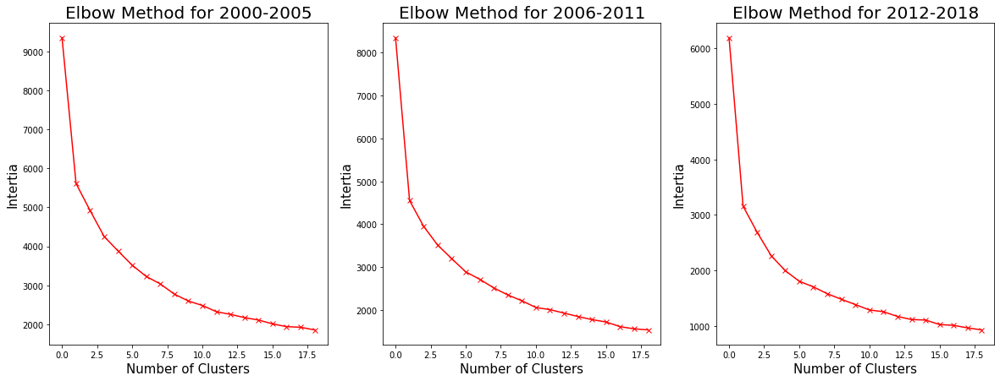

In [10]:
#use elbow method and graph
n_clusters=20
cost2000=[]
cost2006=[]
cost2012=[]

for i in range(1,n_clusters):
    kmean2000= KMeans(i)
    kmean2006= KMeans(i)
    kmean2012= KMeans(i)
    
    kmean2000.fit(x2000)
    kmean2006.fit(x2006)
    kmean2012.fit(x2012)
    
    cost2000.append(kmean2000.inertia_)
    cost2006.append(kmean2006.inertia_)
    cost2012.append(kmean2012.inertia_)
    
plt.figure(figsize=(20, 7))
plt.subplot(1 ,3, 1)    
plt.plot(cost2000, 'rx-')
plt.title('Elbow Method for 2000-2005', fontsize = 20)
plt.ylabel('Intertia', fontsize=15)
plt.xlabel('Number of Clusters', fontsize=15)

plt.subplot(1 ,3, 2)    
plt.plot(cost2006, 'rx-')
plt.title('Elbow Method for 2006-2011', fontsize = 20)
plt.ylabel('Intertia', fontsize=15)
plt.xlabel('Number of Clusters', fontsize=15)

plt.subplot(1 ,3, 3)    
plt.plot(cost2012, 'rx-')
plt.title('Elbow Method for 2012-2018', fontsize = 20)
plt.ylabel('Intertia', fontsize=15)
plt.xlabel('Number of Clusters', fontsize=15)

plt.savefig('elbow_method.png')
plt.show()

## Silhouette Score Method

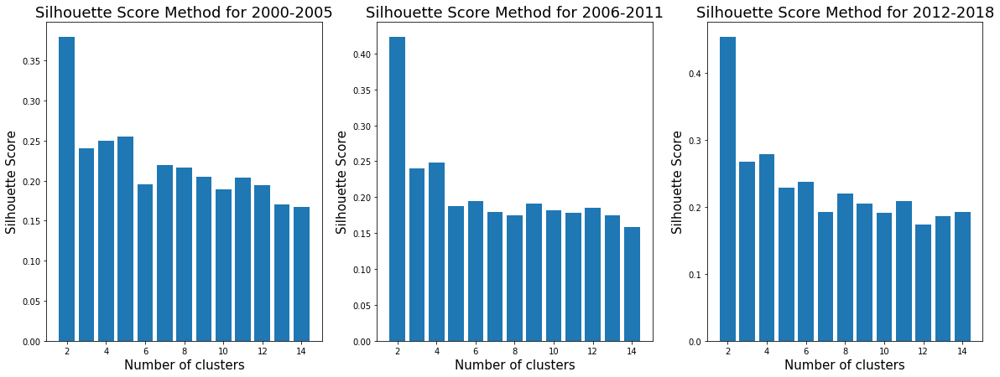

In [11]:
#silhhouette score method and graph
silhouette_scores2000 = []
silhouette_scores2006 = []
silhouette_scores2012 = []

for n_cluster in range(2, 15):
    silhouette_scores2000.append( 
        silhouette_score(x2000, KMeans(n_clusters = n_cluster).fit_predict(x2000)))
    silhouette_scores2006.append( 
        silhouette_score(x2006, KMeans(n_clusters = n_cluster).fit_predict(x2006)))
    silhouette_scores2012.append( 
        silhouette_score(x2012, KMeans(n_clusters = n_cluster).fit_predict(x2012)))

k = [2, 3, 4, 5, 6,7,8,9,10,11,12,13,14]

plt.figure(figsize=(20, 7))
plt.subplot(1 ,3, 1) 
plt.bar(k, silhouette_scores2000) 
plt.xlabel('Number of clusters', fontsize = 15) 
plt.ylabel('Silhouette Score', fontsize = 15) 
plt.title('Silhouette Score Method for 2000-2005', fontsize=18)

plt.subplot(1 ,3, 2) 
plt.bar(k, silhouette_scores2006) 
plt.xlabel('Number of clusters', fontsize = 15) 
plt.ylabel('Silhouette Score', fontsize = 15) 
plt.title('Silhouette Score Method for 2006-2011', fontsize=18)

plt.subplot(1 ,3, 3) 
plt.bar(k, silhouette_scores2012) 
plt.xlabel('Number of clusters', fontsize = 15) 
plt.ylabel('Silhouette Score', fontsize = 15) 
plt.title('Silhouette Score Method for 2012-2018', fontsize=18)

plt.savefig('sil_score.png')
plt.show()

In [40]:
#initialize kmeans model
kmean2000= KMeans(2)
kmean2000.fit(x2000)
kmean_labels2000=kmean2000.labels_

kmean2006= KMeans(2)
kmean2006.fit(x2006)
kmean_labels2006=kmean2006.labels_

kmean2012= KMeans(2)
kmean2012.fit(x2012)
kmean_labels2012=kmean2012.labels_

In [41]:
#create original data set that also shows which cluster they belong to
clusters2000 = pd.concat([df2000, pd.DataFrame({'cluster2000':kmean_labels2000})], axis=1)
clusters2006 = pd.concat([df2006, pd.DataFrame({'cluster2006':kmean_labels2006})], axis=1)
clusters2012 = pd.concat([df2012, pd.DataFrame({'cluster2012':kmean_labels2012})], axis=1)

clusters = pd.concat([clusters2000, clusters2006, clusters2012], axis = 0)
clusters = clusters.groupby('Country Name').mean()
clusters = clusters.reset_index()
clusters

,Country Name,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Age population, age 00, female, interpolated","Age population, age 00, male, interpolated","Age population, age 01, female, interpolated","Age population, age 01, male, interpolated","Age population, age 02, female, interpolated","Age population, age 02, male, interpolated","Age population, age 03, female, interpolated","Age population, age 03, male, interpolated","Age population, age 04, female, interpolated","Age population, age 04, male, interpolated","Age population, age 05, female, interpolated","Age population, age 05, male, interpolated","Age population, age 06, female, interpolated","Age population, age 06, male, interpolated","Age population, age 07, female, interpolated","Age population, age 07, male, interpolated","Age population, age 08, female, interpolated","Age population, age 08, male, interpolated","Age population, age 09, female, interpolated","Age population, age 09, male, interpolated","Age population, age 10, female, interpolated","Age population, age 10, male, interpolated","Age population, age 11, female, interpolated","Age population, age 11, male, interpolated","Age population, age 12, female, interpolated","Age population, age 12, male, interpolated","Age population, age 13, female, interpolated","Age population, age 13, male, interpolated","Age population, age 14, female, interpolated","Age population, age 14, male, interpolated","Age population, age 15, female, interpolated","Age population, age 15, male, interpolated","Age population, age 16, female, interpolated","Age population, age 16, male, interpolated","Age population, age 17, female, interpolated","Age population, age 17, male, interpolated","Age population, age 18, female, interpolated","Age population, age 18, male, interpolated","Age population, age 19, female, interpolated","Age population, age 19, male, interpolated","Age population, age 20, female, interpolated","Age population, age 20, male, interpolated","Age population, age 21, female, interpolated","Age population, age 21, male, interpolated","Age population, age 22, female, interpolated","Age population, age 22, male, interpolated","Age population, age 23, female, interpolated","Age population, age 23, male, interpolated","Age population, age 24, female, interpolated","Age population, age 24, male, interpolated","Age population, age 25, female, interpolated","Age population, age 25, male, interpolated","Birth rate, crude (per 1,000 people)","Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)","Cause of death, by injury (% of total)","Cause of death, by non-communicable diseases (% of total)","Death rate, crude (per 1,000 people)","Fertility rate, total (births per woman)","Immunization, DPT (% of children ages 12-23 months)","Immunization, Pol3 (% of one-year-old children)","Immunization, measles (% of children ages 12-23 months)","Incidence of tuberculosis (per 100,000 people)","Labor force, female (% of total labor force)","Labor force, total","Life expectancy at birth, female (years)","Life expectancy at birth, male (years)","Life expectancy at birth, total (years)",Lifetime risk of maternal death (%),Lifetime risk of maternal death (1 in: rate varies by country),"Maternal mortality ratio (modeled estimate, per 100,000 live births)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70 (%)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70, female (%)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70, male (%)","Mortality rate attributed to unintentional poisoning (per 100,000 population)","Mortality rate attributed to unintentional poisoning, female (per 100,000 female population)","Mortality rate attributed to unintentional poisoning, male (per 100,000 male population)","Mo

In [42]:
#perform PCA on dataset to graph
pca2000 = PCA(n_components=2)
pca2006 = PCA(n_components=2)
pca2012 = PCA(n_components=2)

principalComponents2000 = pca2000.fit_transform(scaled_df2000)
principalComponents2006 = pca2006.fit_transform(scaled_df2006)
principalComponents2012 = pca2012.fit_transform(scaled_df2012)

df_pca2000 = pd.DataFrame(data = principalComponents2000
             , columns = ['principal component 1', 'principal component 2'])
df_pca2006 = pd.DataFrame(data = principalComponents2006
             , columns = ['principal component 3', 'principal component 4'])
df_pca2012 = pd.DataFrame(data = principalComponents2012
             , columns = ['principal component 5', 'principal component 6'])

df_pca = pd.concat([df_pca2000, df_pca2006, df_pca2012], axis = 1)
df_pca = df_pca.dropna()

df_pca

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6
0,7.360355,1.476368,7.644616,-1.328033,6.195065,0.595828
1,-5.029076,1.014698,-5.459813,-1.066179,-4.972141,0.775698
2,-3.267951,1.301858,-2.780207,-2.888622,-2.052923,1.059601
3,9.987987,-0.550296,10.129448,-0.869342,7.947997,-0.254552
4,-5.281569,-0.678584,-4.562667,-0.172141,-4.013364,-0.598344
...,...,...,...,...,...,...
139,-4.267168,0.758293,-2.930925,-2.039124,-2.526322,-0.279291
140,-1.815466,2.223886,-3.070435,-1.233142,-2.469652,1.350402
141,4.764252,0.340643,5.390259,-0.518827,4.544276,1.077972
142,8.117105,-2.649597,7.065493,0.726328,5.900993,-1.259444


In [43]:
#append PCA with the cluster they belong to
df_pca_kmean = pd.concat([df_pca, pd.DataFrame({'cluster2000':kmean_labels2000}),
                          pd.DataFrame({'cluster2006':kmean_labels2006}),
                          pd.DataFrame({'cluster2012':kmean_labels2012})], axis = 1)
df_pca_kmean = df_pca_kmean.dropna(axis=0)
df_pca_kmean

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,cluster2000,cluster2006,cluster2012
0,7.360355,1.476368,7.644616,-1.328033,6.195065,0.595828,0,0,0
1,-5.029076,1.014698,-5.459813,-1.066179,-4.972141,0.775698,1,1,1
2,-3.267951,1.301858,-2.780207,-2.888622,-2.052923,1.059601,1,1,1
3,9.987987,-0.550296,10.129448,-0.869342,7.947997,-0.254552,0,0,0
4,-5.281569,-0.678584,-4.562667,-0.172141,-4.013364,-0.598344,1,1,1
...,...,...,...,...,...,...,...,...,...
139,-4.267168,0.758293,-2.930925,-2.039124,-2.526322,-0.279291,1,1,1
140,-1.815466,2.223886,-3.070435,-1.233142,-2.469652,1.350402,1,1,1
141,4.764252,0.340643,5.390259,-0.518827,4.544276,1.077972,0,0,0
142,8.117105,-2.649597,7.065493,0.726328,5.900993,-1.259444,0,0,0


## Dataset With Principal Components and Clusters

In [44]:
clusters = clusters.join(df_pca.set_index(clusters.index))

In [45]:
clusters

,Country Name,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Age population, age 00, female, interpolated","Age population, age 00, male, interpolated","Age population, age 01, female, interpolated","Age population, age 01, male, interpolated","Age population, age 02, female, interpolated","Age population, age 02, male, interpolated","Age population, age 03, female, interpolated","Age population, age 03, male, interpolated","Age population, age 04, female, interpolated","Age population, age 04, male, interpolated","Age population, age 05, female, interpolated","Age population, age 05, male, interpolated","Age population, age 06, female, interpolated","Age population, age 06, male, interpolated","Age population, age 07, female, interpolated","Age population, age 07, male, interpolated","Age population, age 08, female, interpolated","Age population, age 08, male, interpolated","Age population, age 09, female, interpolated","Age population, age 09, male, interpolated","Age population, age 10, female, interpolated","Age population, age 10, male, interpolated","Age population, age 11, female, interpolated","Age population, age 11, male, interpolated","Age population, age 12, female, interpolated","Age population, age 12, male, interpolated","Age population, age 13, female, interpolated","Age population, age 13, male, interpolated","Age population, age 14, female, interpolated","Age population, age 14, male, interpolated","Age population, age 15, female, interpolated","Age population, age 15, male, interpolated","Age population, age 16, female, interpolated","Age population, age 16, male, interpolated","Age population, age 17, female, interpolated","Age population, age 17, male, interpolated","Age population, age 18, female, interpolated","Age population, age 18, male, interpolated","Age population, age 19, female, interpolated","Age population, age 19, male, interpolated","Age population, age 20, female, interpolated","Age population, age 20, male, interpolated","Age population, age 21, female, interpolated","Age population, age 21, male, interpolated","Age population, age 22, female, interpolated","Age population, age 22, male, interpolated","Age population, age 23, female, interpolated","Age population, age 23, male, interpolated","Age population, age 24, female, interpolated","Age population, age 24, male, interpolated","Age population, age 25, female, interpolated","Age population, age 25, male, interpolated","Birth rate, crude (per 1,000 people)","Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)","Cause of death, by injury (% of total)","Cause of death, by non-communicable diseases (% of total)","Death rate, crude (per 1,000 people)","Fertility rate, total (births per woman)","Immunization, DPT (% of children ages 12-23 months)","Immunization, Pol3 (% of one-year-old children)","Immunization, measles (% of children ages 12-23 months)","Incidence of tuberculosis (per 100,000 people)","Labor force, female (% of total labor force)","Labor force, total","Life expectancy at birth, female (years)","Life expectancy at birth, male (years)","Life expectancy at birth, total (years)",Lifetime risk of maternal death (%),Lifetime risk of maternal death (1 in: rate varies by country),"Maternal mortality ratio (modeled estimate, per 100,000 live births)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70 (%)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70, female (%)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70, male (%)","Mortality rate attributed to unintentional poisoning (per 100,000 population)","Mortality rate attributed to unintentional poisoning, female (per 100,000 female population)","Mortality rate attributed to unintentional poisoning, male (per 100,000 male population)","Mo

## PCA Graphical Representation of Clustering

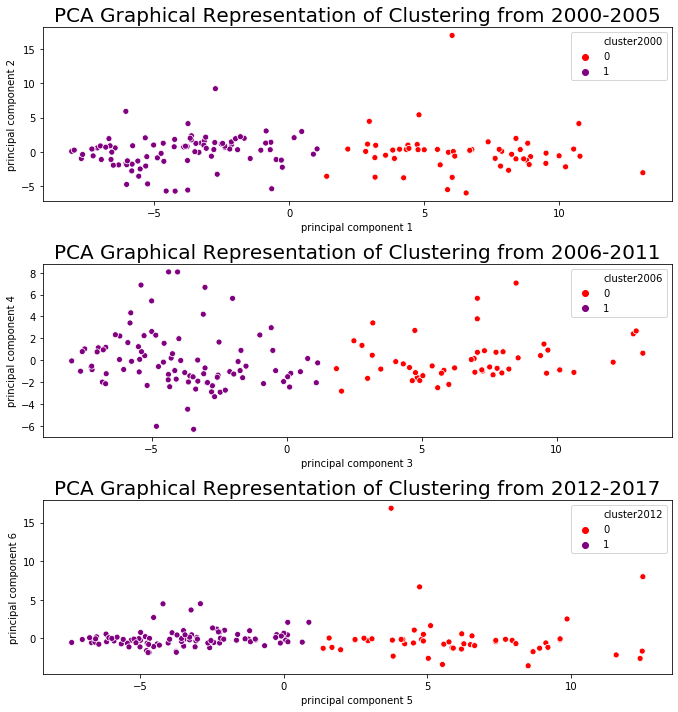

In [46]:
#graph PCA clustering
plt.figure(figsize=(10,10))

plt.subplot(3 ,1, 1) 
ax = sns.scatterplot(x="principal component 1", y="principal component 2", hue="cluster2000", data=df_pca_kmean,palette=['red','purple'])
plt.title('PCA Graphical Representation of Clustering from 2000-2005', fontsize = 20)

plt.subplot(3 ,1, 2) 
ax = sns.scatterplot(x="principal component 3", y="principal component 4", hue="cluster2006", data=df_pca_kmean,palette=['red','purple'])
plt.title('PCA Graphical Representation of Clustering from 2006-2011', fontsize = 20)

plt.subplot(3 ,1, 3) 
ax = sns.scatterplot(x="principal component 5", y="principal component 6", hue="cluster2012", data=df_pca_kmean,palette=['red','purple'])
plt.title('PCA Graphical Representation of Clustering from 2012-2017', fontsize = 20)
plt.xticks(np.arange(-5, 15, step=5))


plt.tight_layout()
plt.savefig('PCA_graph.png')
plt.show()

In [47]:
px.scatter(clusters,x = 'principal component 1', y = 'principal component 2',
           size = 'Adolescent fertility rate (births per 1,000 women ages 15-19)', color='Country Name',
           symbol = 'cluster2000',  width=1000, height=400, title = 'Clustering from 2000-2005')

In [48]:
px.scatter(clusters,x = 'principal component 3', y = 'principal component 4',
           size = 'Adolescent fertility rate (births per 1,000 women ages 15-19)', color='Country Name',
           symbol = 'cluster2006', width=1000, height=400, title = 'Clustering from 2006-2011')

In [49]:
px.scatter(clusters,x = 'principal component 5', y = 'principal component 6',
           size = 'Adolescent fertility rate (births per 1,000 women ages 15-19)', color='Country Name',
           symbol = 'cluster2012', width=1000, height=400, title = 'Clustering from 2012-2017')

In [32]:
col_to_drop = ['Age population, age 00, female, interpolated','Age population, age 00, male, interpolated',
               'Age population, age 01, female, interpolated','Age population, age 01, male, interpolated',
               'Age population, age 02, female, interpolated','Age population, age 02, male, interpolated',
               'Age population, age 03, female, interpolated','Age population, age 03, male, interpolated',
               'Age population, age 04, female, interpolated','Age population, age 04, male, interpolated',
               'Age population, age 05, female, interpolated','Age population, age 05, male, interpolated',
               'Age population, age 06, female, interpolated','Age population, age 06, male, interpolated',
               'Age population, age 07, female, interpolated','Age population, age 07, male, interpolated',
               'Age population, age 08, female, interpolated','Age population, age 08, male, interpolated',
               'Age population, age 09, female, interpolated','Age population, age 09, male, interpolated',
               'Age population, age 10, female, interpolated','Age population, age 10, male, interpolated',
               'Age population, age 11, female, interpolated','Age population, age 11, male, interpolated',
               'Age population, age 12, female, interpolated','Age population, age 12, male, interpolated',
               'Age population, age 13, female, interpolated','Age population, age 13, male, interpolated',
               'Age population, age 14, female, interpolated','Age population, age 14, male, interpolated',
               'Age population, age 15, female, interpolated','Age population, age 15, male, interpolated',
               'Age population, age 16, female, interpolated','Age population, age 16, male, interpolated',
               'Age population, age 17, female, interpolated','Age population, age 17, male, interpolated',
               'Age population, age 18, female, interpolated','Age population, age 18, male, interpolated',
               'Age population, age 19, female, interpolated','Age population, age 19, male, interpolated',
               'Age population, age 20, female, interpolated','Age population, age 20, male, interpolated',
               'Age population, age 21, female, interpolated','Age population, age 21, male, interpolated',
               'Age population, age 22, female, interpolated','Age population, age 22, male, interpolated',
               'Age population, age 23, female, interpolated','Age population, age 23, male, interpolated',
               'Age population, age 24, female, interpolated','Age population, age 24, male, interpolated',
               'Age population, age 25, female, interpolated','Age population, age 25, male, interpolated',
               'Population ages 00-04, female','Population ages 00-04, female (% of female population)',
               'Population ages 00-04, male','Population ages 00-04, male (% of male population)',
               'Population ages 00-14, total','Population ages 0-14 (% of total population)',
               'Population ages 0-14, female','Population ages 0-14, female (% of female population)',
               'Population ages 0-14, male','Population ages 0-14, male (% of male population)',
               'Population ages 05-09, female','Population ages 05-09, female (% of female population)',
               'Population ages 05-09, male','Population ages 05-09, male (% of male population)',
               'Population ages 10-14, female','Population ages 10-14, female (% of female population)',
               'Population ages 10-14, male','Population ages 10-14, male (% of male population)',
               'Population ages 15-19, female','Population ages 15-19, female (% of female population)',
               'Population ages 15-19, male','Population ages 15-19, male (% of male population)',
               'Population ages 15-64 (% of total population)','Population ages 15-64, female',
               'Population ages 15-64, female (% of female population)','Population ages 15-64, male',
               'Population ages 15-64, male (% of male population)','Population ages 15-64, total',
               'Population ages 20-24, female','Population ages 20-24, female (% of female population)',
               'Population ages 20-24, male','Population ages 20-24, male (% of male population)',
               'Population ages 25-29, female',
               'Population ages 25-29, female (% of female population)','Population ages 25-29, male',
               'Population ages 25-29, male (% of male population)','Population ages 30-34, female',
               'Population ages 30-34, female (% of female population)','Population ages 30-34, male',
               'Population ages 30-34, male (% of male population)','Population ages 35-39, female',
               'Population ages 35-39, female (% of female population)','Population ages 35-39, male',
               'Population ages 35-39, male (% of male population)','Population ages 40-44, female',
               'Population ages 40-44, female (% of female population)','Population ages 40-44, male',
               'Population ages 40-44, male (% of male population)','Population ages 45-49, female',
               'Population ages 45-49, female (% of female population)','Population ages 45-49, male',
               'Population ages 45-49, male (% of male population)','Population ages 50-54, female',
               'Population ages 50-54, female (% of female population)','Population ages 50-54, male',
               'Population ages 50-54, male (% of male population)','Population ages 55-59, female',
               'Population ages 55-59, female (% of female population)','Population ages 55-59, male',
               'Population ages 55-59, male (% of male population)','Population ages 60-64, female',
               'Population ages 60-64, female (% of female population)','Population ages 60-64, male',
               'Population ages 60-64, male (% of male population)',
               'Population ages 65 and above (% of total population)','Population ages 65 and above, female',
               'Population ages 65 and above, female (% of female population)','Population ages 65 and above, male',
               'Population ages 65 and above, male (% of male population)','Population ages 65 and above, total',
               'Population ages 65-69, female','Population ages 65-69, female (% of female population)',
               'Population ages 65-69, male','Population ages 65-69, male (% of male population)',
               'Population ages 70-74, female','Population ages 70-74, female (% of female population)',
               'Population ages 70-74, male','Population ages 70-74, male (% of male population)',
               'Population ages 75-79, female','Population ages 75-79, female (% of female population)',
               'Population ages 75-79, male','Population ages 75-79, male (% of male population)',
               'Population ages 80 and above, female','Population ages 80 and above, male',
               'Population ages 80 and above, male (% of male population)',
               'Population ages 80 and older, female (% of female population)']
clusters = clusters.drop(col_to_drop, axis=1)
clusters

,Country Name,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Birth rate, crude (per 1,000 people)","Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)","Cause of death, by injury (% of total)","Cause of death, by non-communicable diseases (% of total)","Death rate, crude (per 1,000 people)","Fertility rate, total (births per woman)","Immunization, DPT (% of children ages 12-23 months)","Immunization, Pol3 (% of one-year-old children)","Immunization, measles (% of children ages 12-23 months)","Incidence of tuberculosis (per 100,000 people)","Labor force, female (% of total labor force)","Labor force, total","Life expectancy at birth, female (years)","Life expectancy at birth, male (years)","Life expectancy at birth, total (years)",Lifetime risk of maternal death (%),Lifetime risk of maternal death (1 in: rate varies by country),"Maternal mortality ratio (modeled estimate, per 100,000 live births)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70 (%)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70, female (%)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70, male (%)","Mortality rate attributed to unintentional poisoning (per 100,000 population)","Mortality rate attributed to unintentional poisoning, female (per 100,000 female population)","Mortality rate attributed to unintentional poisoning, male (per 100,000 male population)","Mortality rate, adult, female (per 1,000 female adults)","Mortality rate, adult, male (per 1,000 male adults)","Mortality rate, infant (per 1,000 live births)","Mortality rate, infant, female (per 1,000 live births)","Mortality rate, infant, male (per 1,000 live births)","Mortality rate, neonatal (per 1,000 live births)","Mortality rate, under-5 (per 1,000)","Mortality rate, under-5, female (per 1,000)","Mortality rate, under-5, male (per 1,000)",Number of deaths ages 5-14 years,Number of infant deaths,Number of maternal deaths,Number of neonatal deaths,Number of under-five deaths,People using at least basic drinking water services (% of population),People using at least basic sanitation services (% of population),"Population, female","Population, female (% of total population)","Population, male","Population, male (% of total population)","Population, total",Prevalence of anemia among children (% of children under 5),Prevalence of anemia among non-pregnant women (% of women ages 15-49),Prevalence of anemia among pregnant women (%),Prevalence of anemia among women of reproductive age (% of women ages 15-49),Prevalence of overweight (% of adults),"Prevalence of overweight, female (% of female adults)","Prevalence of overweight, male (% of male adults)","Probability of dying at age 5-14 years (per 1,000 children age 5)",Rural population,Rural population (% of total population),Rural population growth (annual %),Sex ratio at birth (male births per female births),"Suicide mortality rate (per 100,000 population)","Suicide mortality rate, female (per 100,000 female population)","Suicide mortality rate, male (per 100,000 male population)","Survival to age 65, female (% of cohort)","Survival to age 65, male (% of cohort)","Tuberculosis case detection rate (%, all forms)","Tuberculosis death rate (per 100,000 people)","Unemployment, female (% of female labor force)","Unemployment, male (% of male labor force)","Unemployment, total (% of total labor force)",Urban population,Urban population (% of total population),Urban population growth (annual %),cluster2000,cluster2006,cluster2012,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6
0,Afghanistan,117.764333,98.697665,4.645592,94.052073,41.066667,55.80,10.35,33.90,8.903444,6.180722,63.666667,63.666667,58.833333,189.055556,15.295190,

# Cluster Analysis

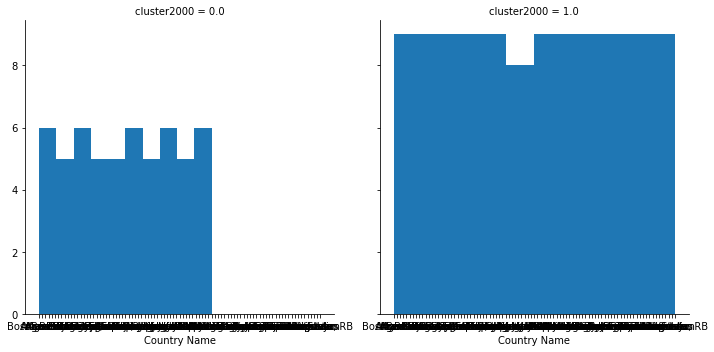

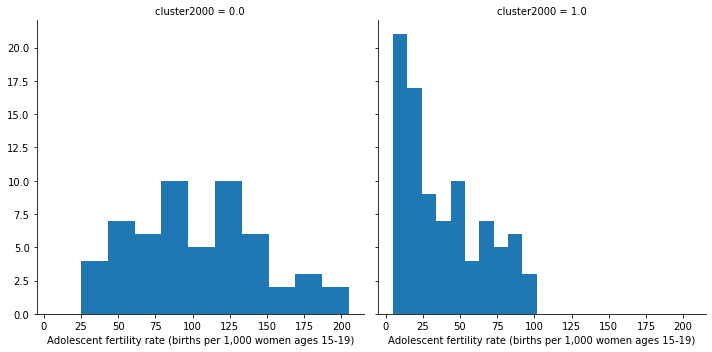

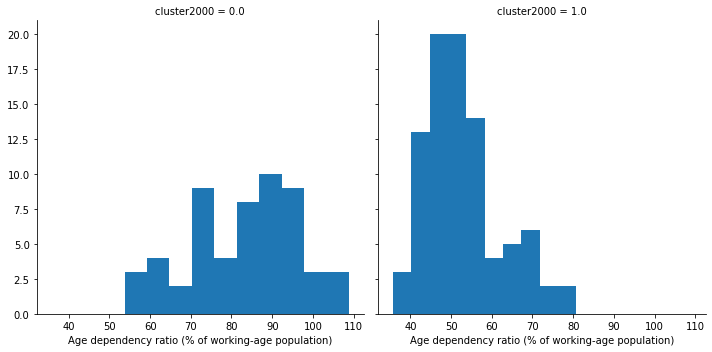

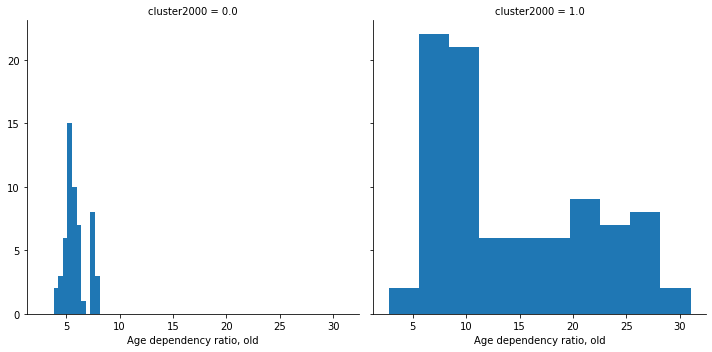

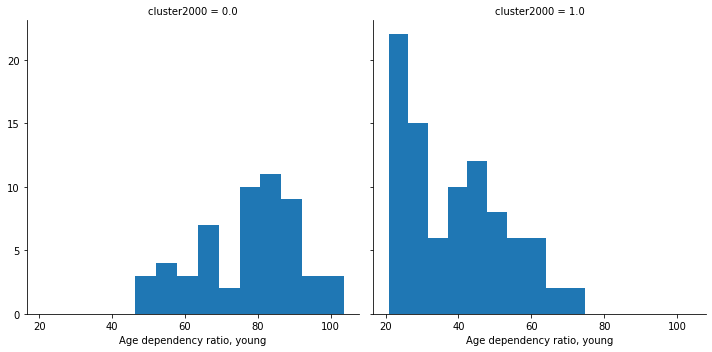

...

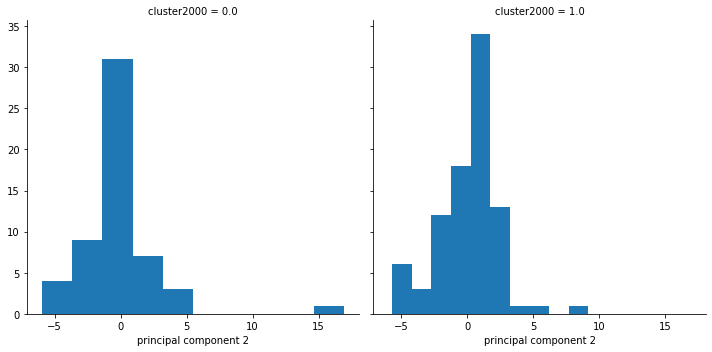

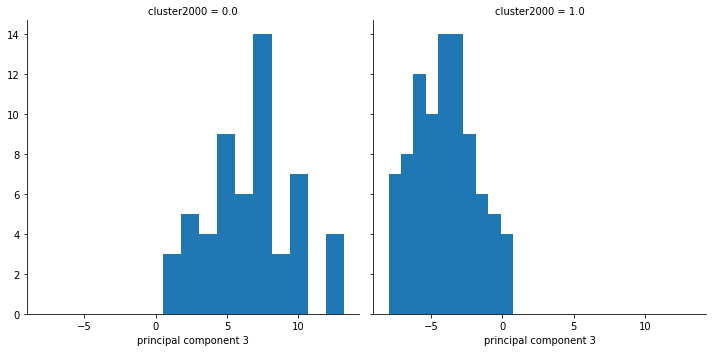

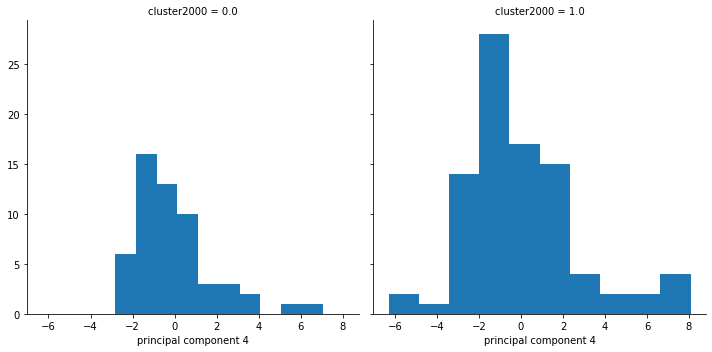

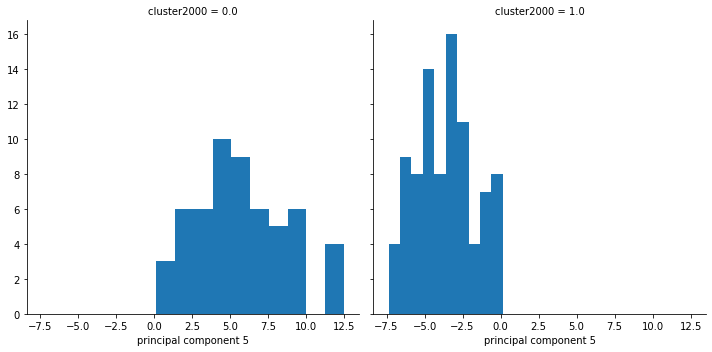

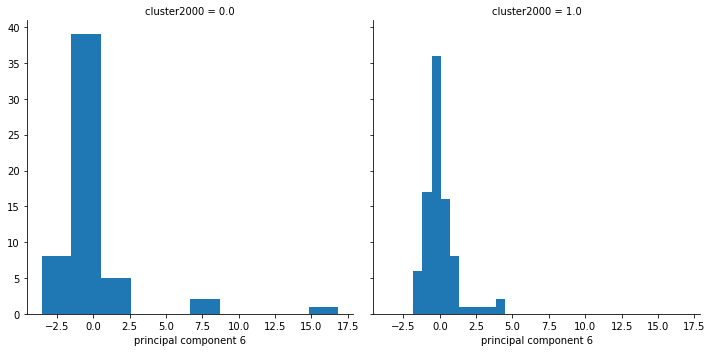

In [40]:
#show histogram of features by cluster
for c in clusters:
    grid= sns.FacetGrid(clusters, col='cluster2000', height=5)
    grid.map(plt.hist, c)

Text(0.5, 0, 'Deaths per 1000 live births')

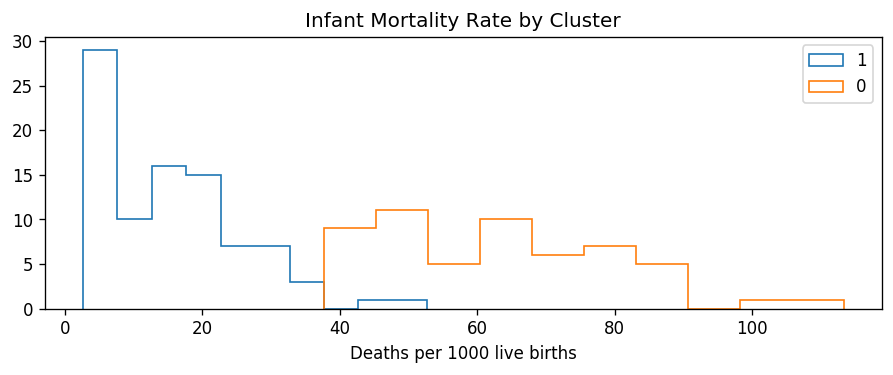

In [312]:

plt.hist([clusters[clusters['cluster2000'] == 1]['Mortality rate, infant (per 1,000 live births)']],
         histtype='step', stacked=True, label='1', fill=False)
plt.hist([clusters[clusters['cluster2000'] == 0]['Mortality rate, infant (per 1,000 live births)']],
         histtype='step', stacked=True, label='0', fill=False)
plt.title('Infant Mortality Rate by Cluster')
plt.legend()
plt.xlabel('Deaths per 1000 live births')

In [41]:
#clusters[(clusters['cluster2000'] != clusters['cluster2006'])]
clusters[clusters['cluster2000'] != clusters['cluster2012']]


,Country Name,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Birth rate, crude (per 1,000 people)","Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)","Cause of death, by injury (% of total)","Cause of death, by non-communicable diseases (% of total)","Death rate, crude (per 1,000 people)","Fertility rate, total (births per woman)","Immunization, DPT (% of children ages 12-23 months)","Immunization, Pol3 (% of one-year-old children)","Immunization, measles (% of children ages 12-23 months)","Incidence of tuberculosis (per 100,000 people)","Labor force, female (% of total labor force)","Labor force, total","Life expectancy at birth, female (years)","Life expectancy at birth, male (years)","Life expectancy at birth, total (years)",Lifetime risk of maternal death (%),Lifetime risk of maternal death (1 in: rate varies by country),"Maternal mortality ratio (modeled estimate, per 100,000 live births)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70 (%)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70, female (%)","Mortality from CVD, cancer, diabetes or CRD between exact ages 30 and 70, male (%)","Mortality rate attributed to unintentional poisoning (per 100,000 population)","Mortality rate attributed to unintentional poisoning, female (per 100,000 female population)","Mortality rate attributed to unintentional poisoning, male (per 100,000 male population)","Mortality rate, adult, female (per 1,000 female adults)","Mortality rate, adult, male (per 1,000 male adults)","Mortality rate, infant (per 1,000 live births)","Mortality rate, infant, female (per 1,000 live births)","Mortality rate, infant, male (per 1,000 live births)","Mortality rate, neonatal (per 1,000 live births)","Mortality rate, under-5 (per 1,000)","Mortality rate, under-5, female (per 1,000)","Mortality rate, under-5, male (per 1,000)",Number of deaths ages 5-14 years,Number of infant deaths,Number of maternal deaths,Number of neonatal deaths,Number of under-five deaths,People using at least basic drinking water services (% of population),People using at least basic sanitation services (% of population),"Population, female","Population, female (% of total population)","Population, male","Population, male (% of total population)","Population, total",Prevalence of anemia among children (% of children under 5),Prevalence of anemia among non-pregnant women (% of women ages 15-49),Prevalence of anemia among pregnant women (%),Prevalence of anemia among women of reproductive age (% of women ages 15-49),Prevalence of overweight (% of adults),"Prevalence of overweight, female (% of female adults)","Prevalence of overweight, male (% of male adults)","Probability of dying at age 5-14 years (per 1,000 children age 5)",Rural population,Rural population (% of total population),Rural population growth (annual %),Sex ratio at birth (male births per female births),"Suicide mortality rate (per 100,000 population)","Suicide mortality rate, female (per 100,000 female population)","Suicide mortality rate, male (per 100,000 male population)","Survival to age 65, female (% of cohort)","Survival to age 65, male (% of cohort)","Tuberculosis case detection rate (%, all forms)","Tuberculosis death rate (per 100,000 people)","Unemployment, female (% of female labor force)","Unemployment, male (% of male labor force)","Unemployment, total (% of total labor force)",Urban population,Urban population (% of total population),Urban population growth (annual %),cluster2000,cluster2006,cluster2012,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6
7,Bangladesh,94.547567,59.548198,7.316217,52.231980,22.356611,41.95,7.65,50.45,5.985000,2.497556,95.166667,95.666667,89.666667,221.000000,23.080221,4.9

# Cluster analysis Chart

| Cluster        | Adolescent Fertility Rate | Immunizations | Mortality Rate | Survival to 65 | Life Expectancy |
|----------------|---------------------------|---------------|----------------|----------------|-----------------|
| 0 (Developing) | ~100 per 1000             | ~75%          | ~270 per 1000  | ~60%           | ~60 years       |
| 1 (Developed)  | ~50 per 1000              | ~95%          | ~100 per 1000  | ~85%           | ~75 years       |

# Regression

# Heading of Data Set

In [404]:
df_lr = df[((df['Year'] >= 2000) & (df['Year'] <= 2017))]
df_lr

,Year,Country Name,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Adults (ages 15+) and children (0-14 years) living with HIV,Adults (ages 15+) and children (ages 0-14) newly infected with HIV,Adults (ages 15+) living with HIV,Adults (ages 15+) newly infected with HIV,"Age at first marriage, female","Age at first marriage, male",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Age population, age 00, female, interpolated","Age population, age 00, male, interpolated","Age population, age 01, female, interpolated","Age population, age 01, male, interpolated","Age population, age 02, female, interpolated","Age population, age 02, male, interpolated","Age population, age 03, female, interpolated","Age population, age 03, male, interpolated","Age population, age 04, female, interpolated","Age population, age 04, male, interpolated","Age population, age 05, female, interpolated","Age population, age 05, male, interpolated","Age population, age 06, female, interpolated","Age population, age 06, male, interpolated","Age population, age 07, female, interpolated","Age population, age 07, male, interpolated","Age population, age 08, female, interpolated","Age population, age 08, male, interpolated","Age population, age 09, female, interpolated","Age population, age 09, male, interpolated","Age population, age 10, female, interpolated","Age population, age 10, male, interpolated","Age population, age 11, female, interpolated","Age population, age 11, male, interpolated","Age population, age 12, female, interpolated","Age population, age 12, male, interpolated","Age population, age 13, female, interpolated","Age population, age 13, male, interpolated","Age population, age 14, female, interpolated","Age population, age 14, male, interpolated","Age population, age 15, female, interpolated","Age population, age 15, male, interpolated","Age population, age 16, female, interpolated","Age population, age 16, male, interpolated","Age population, age 17, female, interpolated","Age population, age 17, male, interpolated","Age population, age 18, female, interpolated","Age population, age 18, male, interpolated","Age population, age 19, female, interpolated","Age population, age 19, male, interpolated","Age population, age 20, female, interpolated","Age population, age 20, male, interpolated","Age population, age 21, female, interpolated","Age population, age 21, male, interpolated","Age population, age 22, female, interpolated","Age population, age 22, male, interpolated","Age population, age 23, female, interpolated","Age population, age 23, male, interpolated","Age population, age 24, female, interpolated","Age population, age 24, male, interpolated","Age population, age 25, female, interpolated","Age population, age 25, male, interpolated",AIDS estimated deaths (UNAIDS estimates),Antiretroviral therapy coverage (% of people living with HIV),Antiretroviral therapy coverage for PMTCT (% of pregnant women living with HIV),ARI treatment (% of children under 5 taken to a health provider),"Birth rate, crude (per 1,000 people)",Births attended by skilled health staff (% of total),Capital health expenditure (% of GDP),"Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)","Cause of death, by injury (% of total)","Cause of death, by non-communicable diseases (% of total)",Children (0-14) living with HIV,Children (ages 0-14) newly infected with HIV,Children orphaned by HIV/AIDS,Children with fever receiving antimalarial drugs (% of children under age 5 with fever),"Community health workers (per 1,000 people)",Completeness of birth registration (%),"Completeness of birth registration, female (%)","Completeness of birth registration, male (%)","Completeness of birth registration, rural (%)","Completeness of birth registration, urban (%)",Completeness of death registration with cause-of-death information (%),"Comprehensive correct kn

# Data Cleaning I

* In order to preserve as many features as possible, data taken from 2000 to 2017.
* Dropped aggregate population data
* Dropped rows missing more than 30% of data and any columns missing more than 15% of data
* Dropped any features still missing over 100 data points
* Interpolated data and filled the rest with the median

# Null Value Count:

In [405]:
df_lr = df_lr.drop(col_to_drop,axis=1)
df_lr = df_lr.dropna(thresh = 269 * 0.3, axis = 0)
df_lr = df_lr.dropna(thresh = len(df_lr) * .85, axis=1)

pd.get_option("display.max_rows")
pd.set_option('display.max_rows', 5000)
df_lr.isnull().sum()

Year                                                                                          0
Country Name                                                                                  0
Adolescent fertility rate (births per 1,000 women ages 15-19)                                11
Age dependency ratio (% of working-age population)                                           17
Age dependency ratio, old                                                                    17
Age dependency ratio, young                                                                  17
Birth rate, crude (per 1,000 people)                                                          7
Current health expenditure (% of GDP)                                                       121
Current health expenditure per capita (current US$)                                         121
Current health expenditure per capita, PPP (current international $)                        124
Death rate, crude (per 1,000 people)    

In [406]:
#drop any features missing more than 100 data points
col_to_drop2 = ['People using at least basic sanitation services, rural (% of rural population)',
                'People using at least basic sanitation services, urban  (% of urban population)',
                'People using at least basic drinking water services, rural (% of rural population)',
                'People using at least basic drinking water services, urban (% of urban population)',
                'Current health expenditure per capita (current US$)',
                'Current health expenditure per capita, PPP (current international $)',
                'Domestic general government health expenditure (% of current health expenditure)',
                'Domestic general government health expenditure (% of GDP)',
                'Domestic general government health expenditure (% of general government expenditure)',
                'Domestic general government health expenditure per capita (current US$)',
                'Domestic general government health expenditure per capita, PPP (current international $)',
                'Domestic private health expenditure (% of current health expenditure)',
                'Domestic private health expenditure per capita (current US$)',
                'Immunization, DPT (% of children ages 12-23 months)',
                'Immunization, measles (% of children ages 12-23 months)',
                'Immunization, Pol3 (% of one-year-old children)',
                'Out-of-pocket expenditure (% of current health expenditure)',
                'Out-of-pocket expenditure per capita (current US$)',
                'Out-of-pocket expenditure per capita, PPP (current international $)',
                'People using at least basic drinking water services, rural (% of rural population)',
                'People using at least basic drinking water services, urban (% of urban population)',
                'People using at least basic sanitation services (% of population)',
                'People using at least basic sanitation services, rural (% of rural population)',
                'Current health expenditure (% of GDP)',
                'Domestic private health expenditure per capita, PPP  (current international $)',
                'Tuberculosis treatment success rate (% of new cases)',
                'Prevalence of undernourishment (% of population)','Rural population growth (annual %)',
                'Urban population growth (annual %)','Population growth (annual %)']

#interpolating data
df_lr = df_lr.drop(col_to_drop2, axis=1)
for column_name in df_lr.columns[2:]:
    df_lr[column_name] = df_lr.groupby(['Country Name'])[column_name].transform(lambda x: x.fillna(x.interpolate(method='linear', 
                                              limit_direction='both')))

In [407]:
#fill in remaining missing values with median
for column_name in df_lr.columns[2:]:
    df_lr[column_name].fillna((df_lr[column_name].median()), inplace=True)

In [408]:
df_lr.isnull().sum()

Year                                                                            0
Country Name                                                                    0
Adolescent fertility rate (births per 1,000 women ages 15-19)                   0
Age dependency ratio (% of working-age population)                              0
Age dependency ratio, old                                                       0
Age dependency ratio, young                                                     0
Birth rate, crude (per 1,000 people)                                            0
Death rate, crude (per 1,000 people)                                            0
Fertility rate, total (births per woman)                                        0
GNI per capita, Atlas method (current US$)                                      0
Incidence of tuberculosis (per 100,000 people)                                  0
Labor force, female (% of total labor force)                                    0
Labor force, tot

In [409]:
#drop year and country name columns to finalize the dataset to work with
pd.reset_option('display.max_rows')
df_lr = df_lr.reset_index()
df_lr = df_lr.drop(['Year', 'Country Name', 'index'], axis = 1)
df_lr.round(2)

,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Birth rate, crude (per 1,000 people)","Death rate, crude (per 1,000 people)","Fertility rate, total (births per woman)","GNI per capita, Atlas method (current US$)","Incidence of tuberculosis (per 100,000 people)","Labor force, female (% of total labor force)","Labor force, total","Life expectancy at birth, female (years)","Life expectancy at birth, male (years)","Life expectancy at birth, total (years)",Lifetime risk of maternal death (%),Lifetime risk of maternal death (1 in: rate varies by country),"Maternal mortality ratio (modeled estimate, per 100,000 live births)","Mortality rate, adult, female (per 1,000 female adults)","Mortality rate, adult, male (per 1,000 male adults)","Mortality rate, infant (per 1,000 live births)","Mortality rate, neonatal (per 1,000 live births)","Mortality rate, under-5 (per 1,000)",Number of infant deaths,Number of maternal deaths,Number of neonatal deaths,Number of under-five deaths,People using at least basic drinking water services (% of population),"Population, female","Population, female (% of total population)","Population, male","Population, male (% of total population)","Population, total",Prevalence of anemia among children (% of children under 5),Prevalence of anemia among non-pregnant women (% of women ages 15-49),Prevalence of anemia among pregnant women (%),Prevalence of anemia among women of reproductive age (% of women ages 15-49),Prevalence of overweight (% of adults),"Prevalence of overweight, female (% of female adults)","Prevalence of overweight, male (% of male adults)",Rural population,Rural population (% of total population),"Survival to age 65, female (% of cohort)","Survival to age 65, male (% of cohort)","Tuberculosis case detection rate (%, all forms)","Tuberculosis death rate (per 100,000 people)","Unemployment, female (% of female labor force)","Unemployment, male (% of male labor force)","Unemployment, total (% of total labor force)",Urban population,Urban population (% of total population)
0,153.95,104.86,4.70,100.16,48.02,11.72,7.48,450.0,190.0,14.96,5037884.0,57.12,54.66,55.84,11.22,9.0,1450.0,287.79,333.88,90.6,61.0,129.4,90127.0,15000.0,62440.0,125739.0,27.77,10090447.0,48.56,10689506.0,51.44,20779953.0,50.9,35.7,41.5,36.6,14.2,16.3,12.0,16192155.0,77.92,54.13,48.21,18.0,68.00,14.73,10.95,11.52,4587798.0,22.08
1,19.04,59.72,11.27,48.45,16.44,5.91,2.16,1100.0,22.0,41.64,1326457.0,76.95,71.22,73.96,0.05,2000.0,23.0,65.05,124.34,23.0,11.5,25.9,1205.0,12.0,590.0,1380.0,87.87,1525873.0,49.40,1563154.0,50.60,3089027.0,25.4,24.7,26.5,24.8,46.0,41.6,50.5,1799636.0,58.26,87.62,78.30,87.0,0.69,16.90,16.34,16.57,1289391.0,41.74
2,11.76,63.05,7.02,56.03,19.55,4.96,2.51,1590.0,75.0,13.52,8880362.0,72.08,69.25,70.64,0.40,250.0,161.0,122.26,158.71,33.9,21.3,39.7,20630.0,980.0,12949.0,24421.0,89.84,15311138.0,49.32,15731097.0,50.68,31042235.0,37.1,36.5,37.4,36.5,49.5,55.1,43.6,12442038.0,40.08,78.63,72.94,80.0,8.20,29.72,29.78,29.77,18600197.0,59.92
3,61.97,54.49,10.16,44.33,19.84,6.22,2.20,10140.0,6.1,43.76,3563483.0,75.36,72.42,73.94,0.10,1000.0,44.0,132.27,180.20,13.1,9.1,15.8,20.0,1.0,14.0,23.0,98.25,40302.0,53.02,35714.0,46.98,76016.0,33.5,27.1,29.3,27.2,39.4,46.4,32.0,51594.0,67.87,84.03,74.30,87.0,1.60,6.76,5.74,6.27,24422.0,32.13
4,66.36,61.79,15.74,46.05,19.50,7.84,2.54,7470.0,37.0,42.14,16324711.0,76.98,70.13,73.58,0.18,560.0,66.0,97.30,181.36,17.5,11.0,19.6,12561.0,480.0,7894.0,14069.0,96.21,18976066.0,51.47,17894721.0,48.53,36870787.0,20.4,17.0,30.2,17.6,54.4,52.8,55.9,4003430.0,10.86,83.94,71.60,87.0,2.50,16.34,14.02,15.00,32867357.0,89.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288,118.38,88.32,4.87,83.46,37.08,6.62,4.95,970.0,

# Summary Statistics of Features

In [410]:
df_lr.describe().round(2)

,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Birth rate, crude (per 1,000 people)","Death rate, crude (per 1,000 people)","Fertility rate, total (births per woman)","GNI per capita, Atlas method (current US$)","Incidence of tuberculosis (per 100,000 people)","Labor force, female (% of total labor force)","Labor force, total","Life expectancy at birth, female (years)","Life expectancy at birth, male (years)","Life expectancy at birth, total (years)",Lifetime risk of maternal death (%),Lifetime risk of maternal death (1 in: rate varies by country),"Maternal mortality ratio (modeled estimate, per 100,000 live births)","Mortality rate, adult, female (per 1,000 female adults)","Mortality rate, adult, male (per 1,000 male adults)","Mortality rate, infant (per 1,000 live births)","Mortality rate, neonatal (per 1,000 live births)","Mortality rate, under-5 (per 1,000)",Number of infant deaths,Number of maternal deaths,Number of neonatal deaths,Number of under-five deaths,People using at least basic drinking water services (% of population),"Population, female","Population, female (% of total population)","Population, male","Population, male (% of total population)","Population, total",Prevalence of anemia among children (% of children under 5),Prevalence of anemia among non-pregnant women (% of women ages 15-49),Prevalence of anemia among pregnant women (%),Prevalence of anemia among women of reproductive age (% of women ages 15-49),Prevalence of overweight (% of adults),"Prevalence of overweight, female (% of female adults)","Prevalence of overweight, male (% of male adults)",Rural population,Rural population (% of total population),"Survival to age 65, female (% of cohort)","Survival to age 65, male (% of cohort)","Tuberculosis case detection rate (%, all forms)","Tuberculosis death rate (per 100,000 people)","Unemployment, female (% of female labor force)","Unemployment, male (% of male labor force)","Unemployment, total (% of total labor force)",Urban population,Urban population (% of total population)
count,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3.293000e+03,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3.293000e+03,3293.00,3.293000e+03,3293.00,3.293000e+03,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3.293000e+03,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3293.00,3.293000e+03,3293.00
mean,56.49,62.32,11.58,50.73,23.00,8.43,3.03,10452.82,140.51,40.65,1.686358e+07,71.66,66.82,69.20,1.00,2886.28,206.16,154.23,222.26,29.83,16.40,41.93,29315.22,1988.89,17527.61,40548.70,83.61,1.831863e+07,49.98,1.861806e+07,50.02,3.690925e+07,37.73,29.24,35.06,29.58,43.69,45.69,41.43,1.816606e+07,45.07,75.76,66.42,72.79,17.17,9.21,7.34,7.94,1.875989e+07,55.18
std,45.65,18.89,7.66,23.61,11.16,3.40,1.55,15834.31,193.92,9.46,6.744248e+07,9.69,8.97,9.25,1.74,5035.46,296.49,112.02,116.34,27.25,13.08,43.80,114302.82,7424.04,75958.72,155798.26,19.10,6.606829e+07,2.98,7.015620e+07,2.98,1.362142e+08,20.05,12.53,11.84,12.61,16.41,14.83,19.56,8.154031e+07,22.45,15.22,15.38,19.12,24.50,7.32,5.59,6.03,5.996922e+07,22.71
min,0.28,15.74,0.80,14.92,7.00,1.13,1.05,110.00,0.54,7.91,3.550000e+04,40.01,38.86,39.44,0.00,7.00,2.00,32.92,58.20,1.50,0.90,1.80,6.00,1.00,4.00,7.00,18.70,4.030200e+04,23.29,3.571400e+04,45.44,9.842000e+03,6.10,7.50,11.70,7.70,10.10,12.20,7.70,1.935000e+03,0.09,24.22,14.79,2.80,0.08,0.22,0.06,0.14,5.289000e+03,8.25
25%,18.25,48.30,5.87,28.98,12.73,6.01,1.78,1130.00,17.00,37.81,1.226444e+06,65.09,61.14,63.28,0.03,85.00,17.00,74.92,134.67,7.90,5.00,9.30,368.00,8.00,226.00,439.00,72.22,1.171774e+06,49.66,1.296606e+06,49.02,2.310173e+06,25.20,20.80,26.10,21.00,26.90,32.40,20.00,7.687680e+05,26.39,66.41,56.73,61.00,1.20,3.99,3.56,3.80,1.190403e+06,35.77
50%,46.44,55.99,8.23,45.80

# Data Cleaning II

* Used log transformation on dataset to make features more normally distributed
* Used standard scaler to normalize
* Removed features with high Pearson's correlation score with target variable

# Histogram of Features

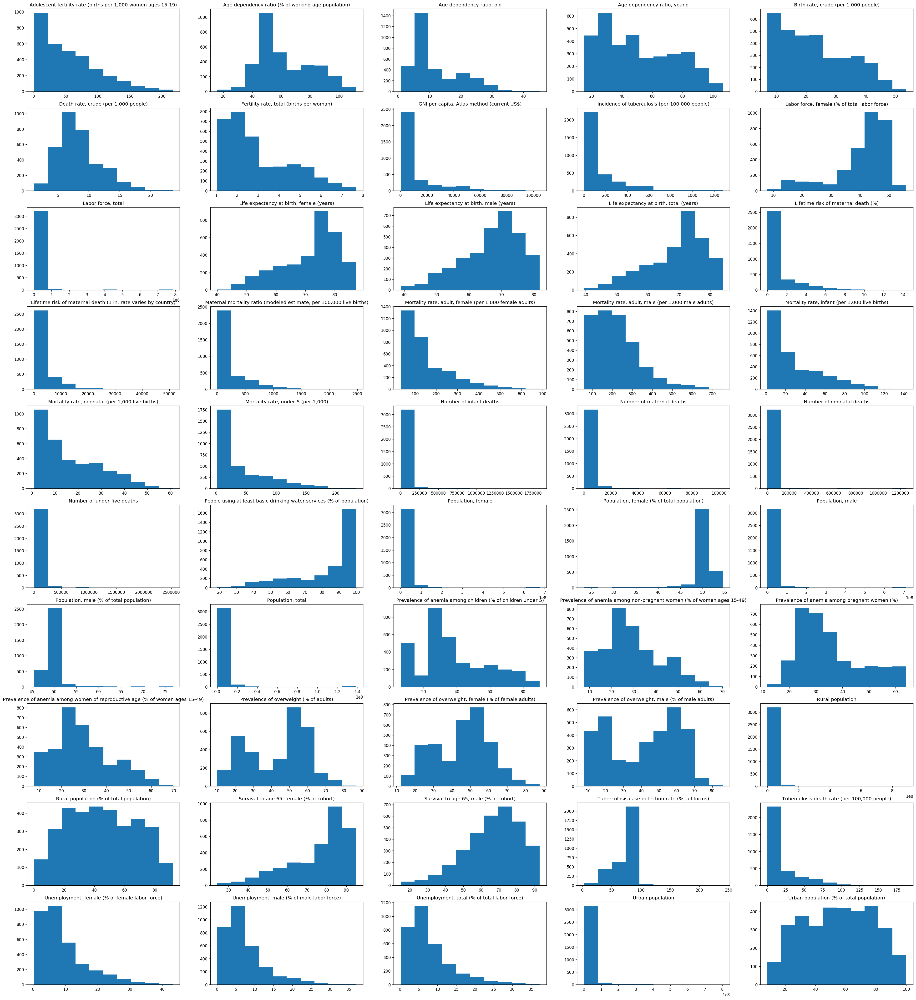

In [411]:
#histogram of values in each column
i = 1
plt.figure(figsize=(40,20))
for column_name in df_lr.columns:
    plt.subplot(11,5,i)
    plt.hist(df_lr[column_name])
    plt.title(df_lr.columns[i-1])
    i = i+1
    
plt.subplots_adjust(bottom=-1)
plt.tight_layout()
plt.show()

# Histogram of Log of Features

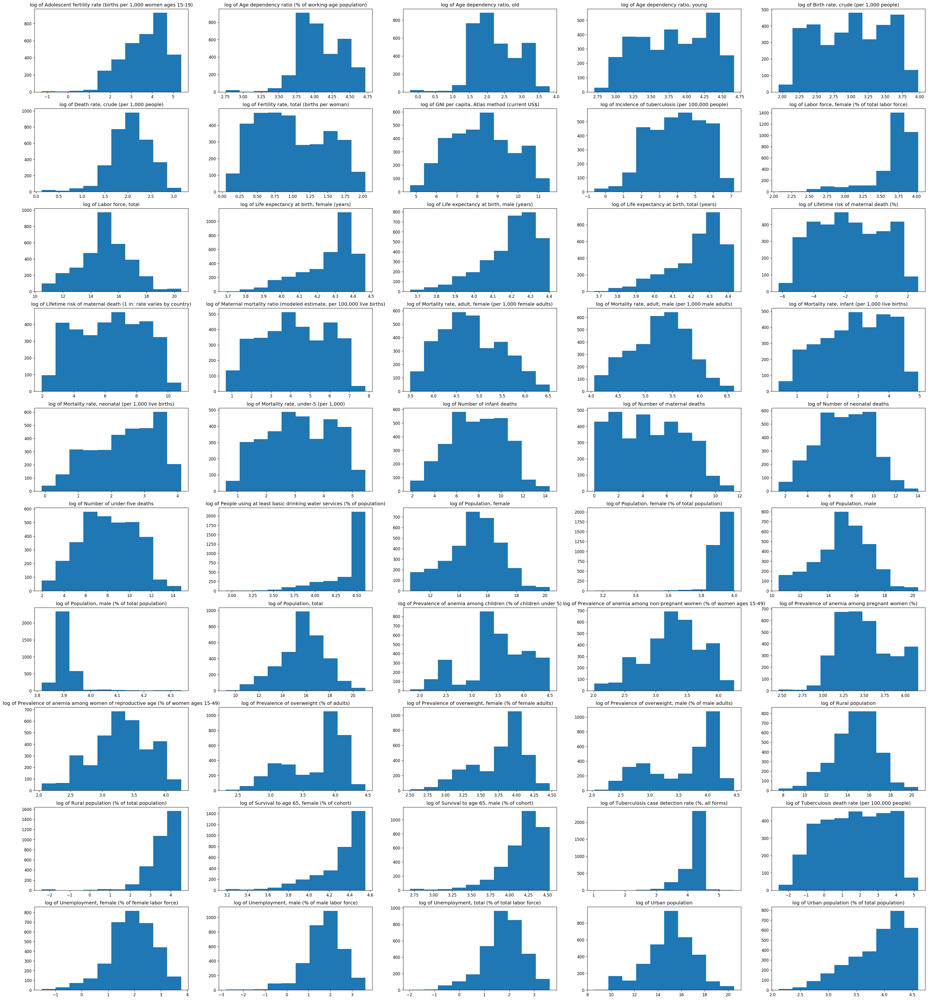

In [412]:
#histogram of values in each column
i = 1
plt.figure(figsize=(40, 20))
for column_name in df_lr.columns:
    plt.subplot(11,5,i)
    plt.hist(np.log(df_lr)[column_name])
    plt.title('log of ' + df_lr.columns[i-1])
    i = i+1
    
plt.subplots_adjust(bottom=-1)
plt.tight_layout()
plt.show()

# Boxplot of Log of Features

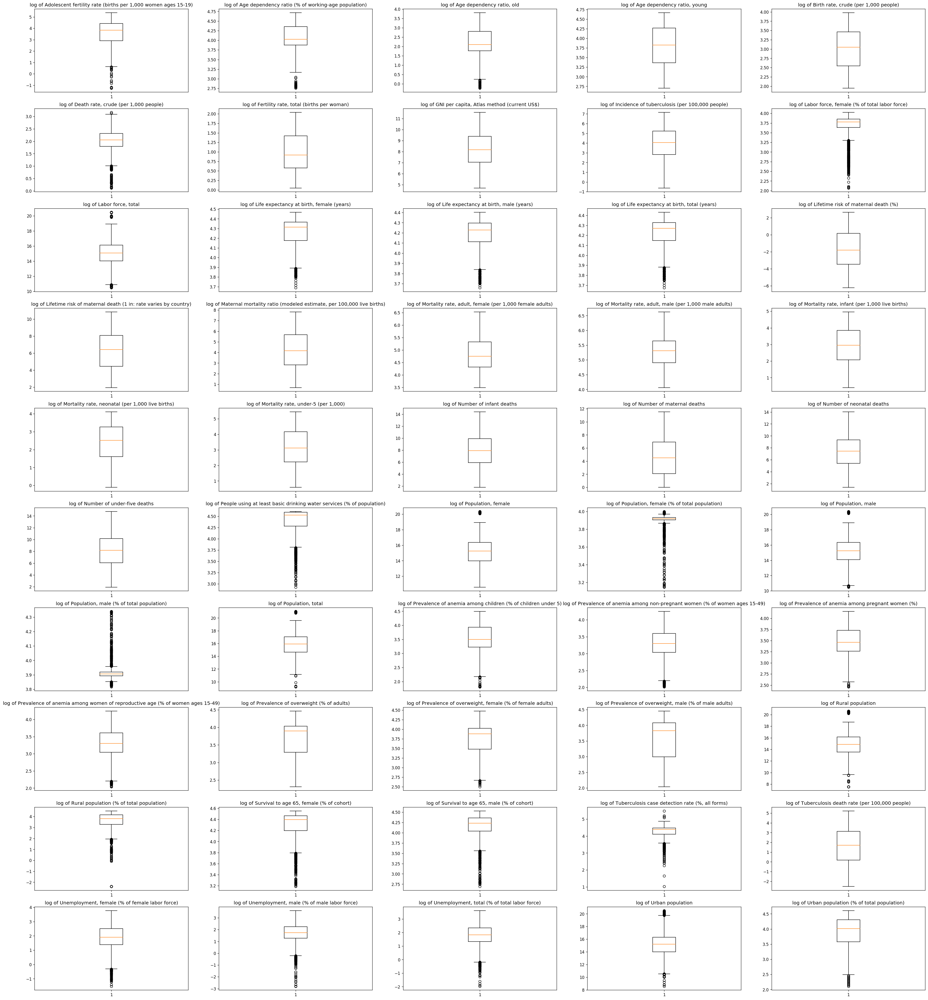

In [413]:
i = 1
plt.figure(figsize=(40,20))
for column_name in df_lr.columns:
    plt.subplot(11,5,i)
    plt.boxplot(np.log(df_lr)[column_name])
    plt.title('log of ' + df_lr.columns[i-1])
    i = i+1
    
plt.subplots_adjust(bottom=-1)
plt.tight_layout()
plt.show()

In [414]:
#Description of the log of features
df_lr = np.log(df_lr)
df_lr.describe()

,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Birth rate, crude (per 1,000 people)","Death rate, crude (per 1,000 people)","Fertility rate, total (births per woman)","GNI per capita, Atlas method (current US$)","Incidence of tuberculosis (per 100,000 people)","Labor force, female (% of total labor force)","Labor force, total","Life expectancy at birth, female (years)","Life expectancy at birth, male (years)","Life expectancy at birth, total (years)",Lifetime risk of maternal death (%),Lifetime risk of maternal death (1 in: rate varies by country),"Maternal mortality ratio (modeled estimate, per 100,000 live births)","Mortality rate, adult, female (per 1,000 female adults)","Mortality rate, adult, male (per 1,000 male adults)","Mortality rate, infant (per 1,000 live births)","Mortality rate, neonatal (per 1,000 live births)","Mortality rate, under-5 (per 1,000)",Number of infant deaths,Number of maternal deaths,Number of neonatal deaths,Number of under-five deaths,People using at least basic drinking water services (% of population),"Population, female","Population, female (% of total population)","Population, male","Population, male (% of total population)","Population, total",Prevalence of anemia among children (% of children under 5),Prevalence of anemia among non-pregnant women (% of women ages 15-49),Prevalence of anemia among pregnant women (%),Prevalence of anemia among women of reproductive age (% of women ages 15-49),Prevalence of overweight (% of adults),"Prevalence of overweight, female (% of female adults)","Prevalence of overweight, male (% of male adults)",Rural population,Rural population (% of total population),"Survival to age 65, female (% of cohort)","Survival to age 65, male (% of cohort)","Tuberculosis case detection rate (%, all forms)","Tuberculosis death rate (per 100,000 people)","Unemployment, female (% of female labor force)","Unemployment, male (% of male labor force)","Unemployment, total (% of total labor force)",Urban population,Urban population (% of total population)
count,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000,3293.000000
mean,3.618149,4.086204,2.247258,3.811370,3.012709,2.046194,0.984741,8.208742,3.994670,3.665453,15.013508,4.261915,4.192140,4.227116,-1.708056,6.313164,4.184225,4.812482,5.270970,2.906195,2.393185,3.147928,7.846135,4.619312,7.340504,8.084394,4.391386,15.066106,3.909279,15.067736,3.910919,15.743127,3.471621,3.278130,3.503601,3.291479,3.688701,3.759400,3.575584,14.748607,3.608623,4.302324,4.162045,4.239233,1.651756,1.898510,1.699426,1.784862,15.042617,3.904661
std,1.029592,0.306918,0.637903,0.489711,0.504592,0.430469,0.492360,1.526660,1.523490,0.312454,1.773057,0.145801,0.143905,0.143889,2.104592,2.104605,1.675992,0.662118,0.523883,1.070699,0.986773,1.151247,2.480329,2.789938,2.425212,2.540623,0.285373,1.892488,0.073871,1.879780,0.052558,1.911271,0.594662,0.454554,0.323470,0.449638,0.447483,0.371860,0.587696,2.070273,0.802328,0.239545,0.280793,0.346050,1.750105,0.860855,0.842008,0.814625,1.998278,0.494108
min,-1.262308,2.756401,-0.228487,2.702435,1.945910,0.119559,0.050693,4.700480,-0.616186,2.068555,10.477288,3.689004,3.659991,3.674806,-6.240440,1.945910,0.693147,3.494080,4.063954,0.405465,-0.105361,0.587787,1.791759,0.000000,1.386294,1.945910,2.928267,10.604156,3.147983,10.483298,3.816287,9.194414,1.808289,2.0149

# Pearson's Correlation Matrix

Text(0.5, 1, 'Correlation matrix')

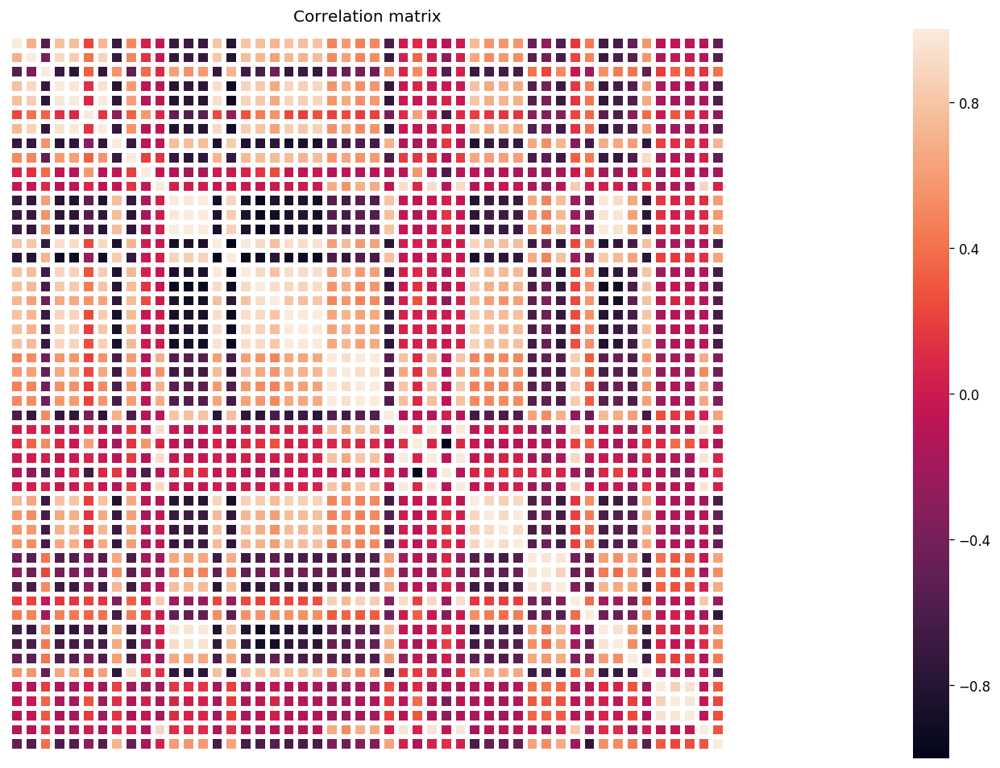

In [415]:
plt.figure(figsize=(50,10))
sns.heatmap(df_lr.corr(), square=True,linewidths=3, xticklabels=[], yticklabels=[])
b, t = plt.ylim()
b += 0.5
t -= 0.5
plt.ylim(b, t)
plt.title('Correlation matrix')

In [416]:
df_lr['Mortality rate, non-adult'] = df_lr['Mortality rate, neonatal (per 1,000 live births)'] + df_lr['Mortality rate, infant (per 1,000 live births)']+ df_lr['Mortality rate, under-5 (per 1,000)']
df_lr['Mortality rate, adult'] = df_lr['Mortality rate, adult, female (per 1,000 female adults)'] + df_lr['Mortality rate, adult, male (per 1,000 male adults)']

collinearity_drop = ['Age dependency ratio (% of working-age population)', 'Age dependency ratio, young', 
                     'Birth rate, crude (per 1,000 people)', 'Fertility rate, total (births per woman)', 
                     'GNI per capita, Atlas method (current US$)', 'Labor force, total',
                     'Life expectancy at birth, female (years)', 'Life expectancy at birth, male (years)',
                     'Lifetime risk of maternal death (%)',
                     'Lifetime risk of maternal death (1 in: rate varies by country)',
                     'Maternal mortality ratio (modeled estimate, per 100,000 live births)', 
                     'Number of infant deaths',
                     'Number of maternal deaths','Number of neonatal deaths','Number of under-five deaths',
                     'Population, female','Population, female (% of total population)','Population, male',
                     'Population, male (% of total population)', 
                     'Prevalence of anemia among children (% of children under 5)',
                     'Prevalence of anemia among non-pregnant women (% of women ages 15-49)',
                     'Prevalence of overweight, female (% of female adults)', 
                     'Prevalence of overweight, male (% of male adults)','Rural population', 
                     'Survival to age 65, female (% of cohort)','Survival to age 65, male (% of cohort)',
                     'Tuberculosis death rate (per 100,000 people)',
                     'Unemployment, female (% of female labor force)','Unemployment, male (% of male labor force)',
                     'Urban population','Mortality rate, adult, female (per 1,000 female adults)',
                     'Mortality rate, adult, male (per 1,000 male adults)',
                     'Mortality rate, infant (per 1,000 live births)',
                     'Mortality rate, neonatal (per 1,000 live births)','Mortality rate, under-5 (per 1,000)',
                     'Mortality rate, non-adult', 'Mortality rate, adult', 'Life expectancy at birth, total (years)',
                     'People using at least basic drinking water services (% of population)',
                     'Prevalence of anemia among pregnant women (%)','Tuberculosis case detection rate (%, all forms)',
                     'Age dependency ratio, old', 'Rural population (% of total population)']

df_lr = df_lr.drop(collinearity_drop, axis=1)

# Final Pearson's Correlation Matrix

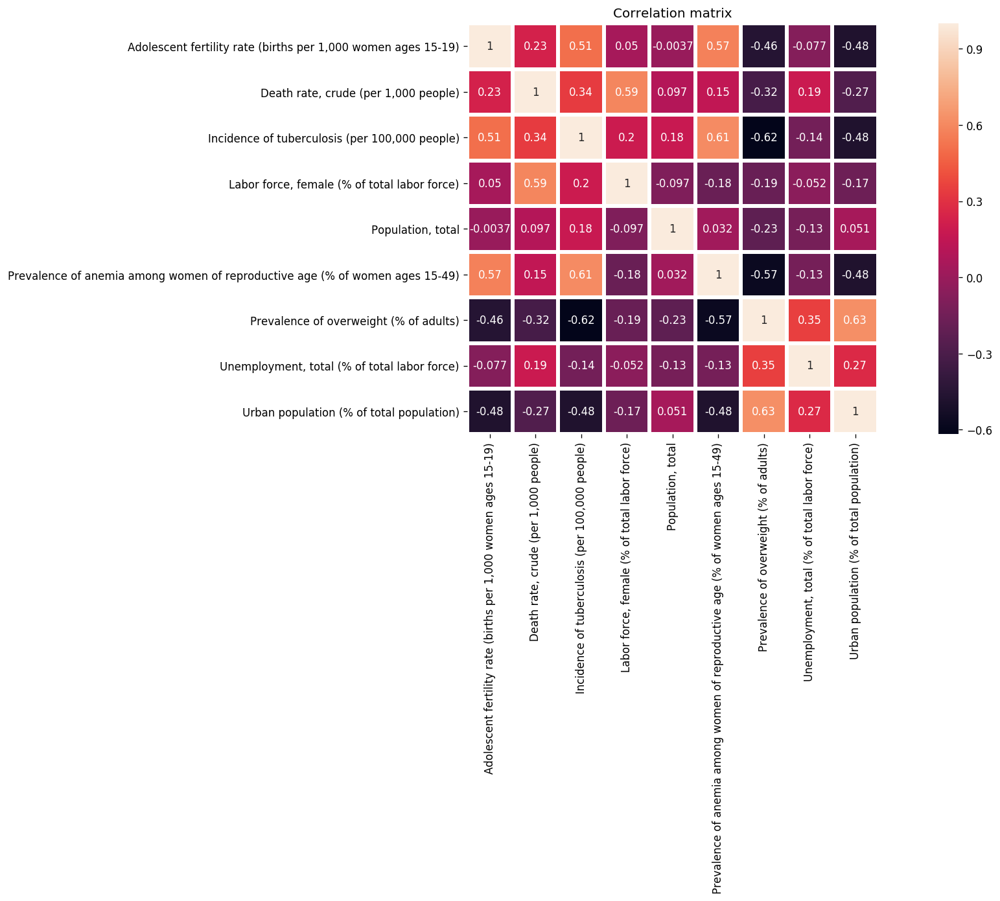

In [417]:
plt.figure(figsize=(20,7))
sns.heatmap(df_lr.corr(), square=True, annot=True, linewidths=3)
b, t = plt.ylim()
b += 0.5
t -= 0.5
plt.ylim(b, t)
plt.title('Correlation matrix')
plt.savefig('correlation.png')


# Scatterplot of Features With Target Variable

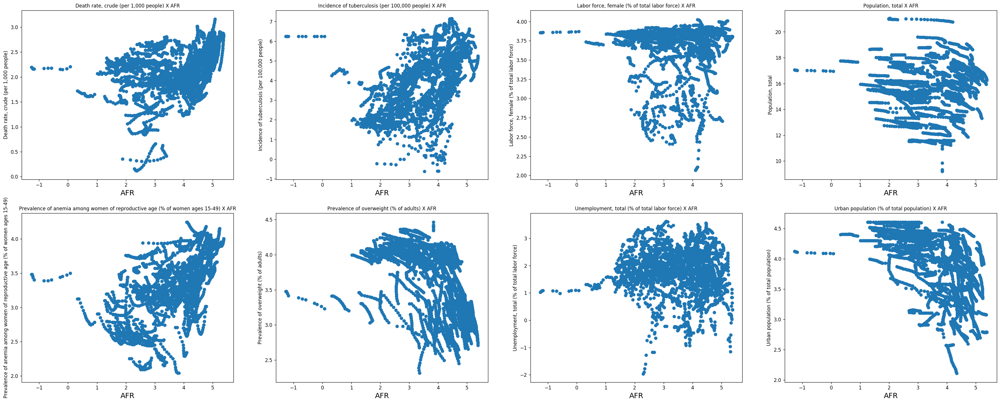

In [418]:
#show scatter plot of each feature and adolescent fertility rate
i = 1
plt.figure(figsize=(15,20))
for col in df_lr.columns[1:]:
    plt.subplot(10,4,i)
    plt.scatter(df_lr['Adolescent fertility rate (births per 1,000 women ages 15-19)'], df_lr[col])
    plt.title(col + ' X AFR', fontsize=10)
    plt.xlabel('AFR', fontsize=15)
    plt.ylabel(col, fontsize=10)
    i = i+1
    
plt.subplots_adjust(bottom=-2, right=2)
plt.show()

In [82]:
#set target variable
final_df = df_lr.copy()

y = final_df['Adolescent fertility rate (births per 1,000 women ages 15-19)']
x = final_df.drop('Adolescent fertility rate (births per 1,000 women ages 15-19)', axis=1)

In [83]:
#split data into train and test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=40)

In [84]:
#scale data
scaler = StandardScaler()

model_features = x.columns.tolist()

x_train[model_features] = scaler.fit_transform(x_train[model_features])
x_test[model_features] = scaler.transform(x_test[model_features])

# Lasso Linear Regression

In [85]:
#initialize lasso regression
alphavec = 10**np.linspace(-2,2,200)

lasso_model = LassoCV(alphas = alphavec, cv=5)
lasso_model.fit(x_train, y_train)

LassoCV(alphas=array([1.00000000e-02, 1.04737090e-02, 1.09698580e-02, 1.14895100e-02,
       1.20337784e-02, 1.26038293e-02, 1.32008840e-02, 1.38262217e-02,
       1.44811823e-02, 1.51671689e-02, 1.58856513e-02, 1.66381689e-02,
       1.74263339e-02, 1.82518349e-02, 1.91164408e-02, 2.00220037e-02,
       2.09704640e-02, 2.19638537e-02, 2.30043012e-02, 2.40940356e-02,
       2.52353917e-02, 2.64308149e-0...
       6.01027678e+01, 6.29498899e+01, 6.59318827e+01, 6.90551352e+01,
       7.23263390e+01, 7.57525026e+01, 7.93409667e+01, 8.30994195e+01,
       8.70359136e+01, 9.11588830e+01, 9.54771611e+01, 1.00000000e+02]),
        copy_X=True, cv=5, eps=0.001, fit_intercept=True, max_iter=1000,
        n_alphas=100, n_jobs=None, normalize=False, positive=False,
        precompute='auto', random_state=None, selection='cyclic', tol=0.0001,
        verbose=False)

# Predicted vs Actual

Text(0.5, 0, 'Actual')

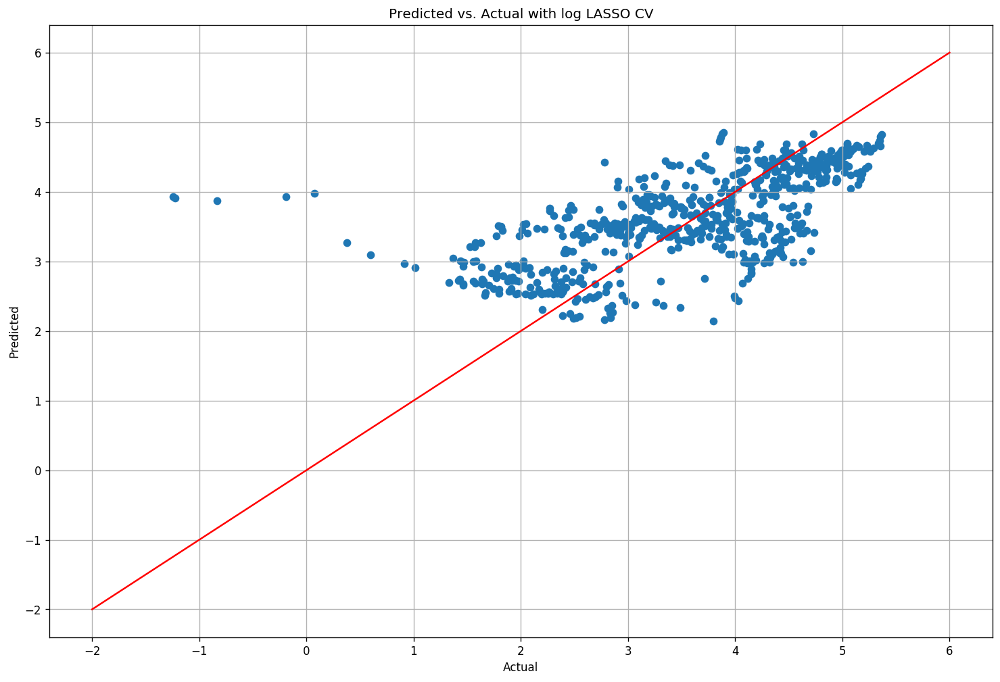

In [428]:
# Predict model on test data
y_pred = lasso_model.predict(x_test)
# Plot
plt.figure(figsize=(15,10))
plt.scatter(y_test, y_pred)
plt.plot([-2,6],[-2,6],color='red')
plt.grid(True)
plt.title('Predicted vs. Actual with log LASSO CV')
plt.ylabel('Predicted')
plt.xlabel('Actual')


# Metrics for Lasso Regression

In [429]:
def mape(y_true, y_pred):
    return np.mean(np.abs(y_pred - y_true)/y_true)

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred).round(3))  
print('Mean Absolute Percent Error', mape(y_test, y_pred).round(3))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred).round(3))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)).round(3))
print('Accuracy Score:' , lasso_model.score(x_test,y_test).round(3))
print('R2 score:', r2_score(y_test, y_pred).round(3))
kf = KFold(n_splits=5, shuffle=True)
print('Cross Value Scores:', cross_val_score(lasso_model, x, y, cv=kf).round(3))


Mean Absolute Error: 0.626
Mean Absolute Percent Error 0.247
Mean Squared Error: 0.699
Root Mean Squared Error: 0.836
Accuracy Score: 0.408
R2 score: 0.408
Cross Value Scores: [0.407 0.43  0.425 0.399 0.391]


# Random Forest Regression

In [430]:
rfr = ensemble.RandomForestRegressor(n_estimators=300)
rfr.fit(x_train, y_train)


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=300, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

# Predicted vs Actual

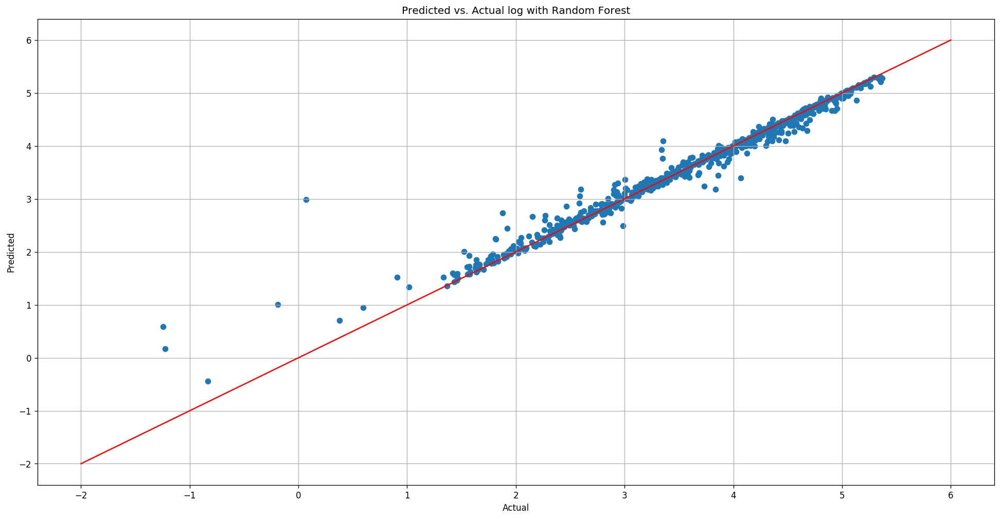

In [431]:
# Predict model on test data
y_pred = rfr.predict(x_test)
# Plot
plt.figure(figsize=(20,10))
plt.scatter(y_test, y_pred)
plt.plot([-2,6],[-2,6],color='red')
plt.grid(True)
plt.title('Predicted vs. Actual log with Random Forest')
plt.ylabel('Predicted')
plt.xlabel('Actual');

# Metrics for Random Forest Regression

In [432]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred).round(3))  
print('Mean Absolute Percent Error', mape(y_test, y_pred).round(3))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred).round(3))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)).round(3))
print('Accuracy Score:' , rfr.score(x_test,y_test).round(3))
print('R2 score:', r2_score(y_test, y_pred).round(3))
print('Cross Value Scores:', cross_val_score(rfr, x, y, cv=kf).round(3))

Mean Absolute Error: 0.091
Mean Absolute Percent Error 0.077
Mean Squared Error: 0.041
Root Mean Squared Error: 0.203
Accuracy Score: 0.965
R2 score: 0.965
Cross Value Scores: [0.983 0.977 0.975 0.983 0.984]


# Feature Importance

In [91]:
feature_importances = pd.DataFrame(rfr.feature_importances_,
                                   index = x_train.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)
print(feature_importances)

                                                    importance
Prevalence of anemia among women of reproductiv...    0.227320
Incidence of tuberculosis (per 100,000 people)        0.174669
Death rate, crude (per 1,000 people)                  0.170683
Urban population (% of total population)              0.152714
Prevalence of overweight (% of adults)                0.099899
Labor force, female (% of total labor force)          0.069511
Population, total                                     0.069033
Unemployment, total (% of total labor force)          0.036171


# Gradient Boosting Regression

In [92]:
gbr = ensemble.GradientBoostingRegressor()
gbr.fit(x_train, y_train)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

# Predicted vs Actual

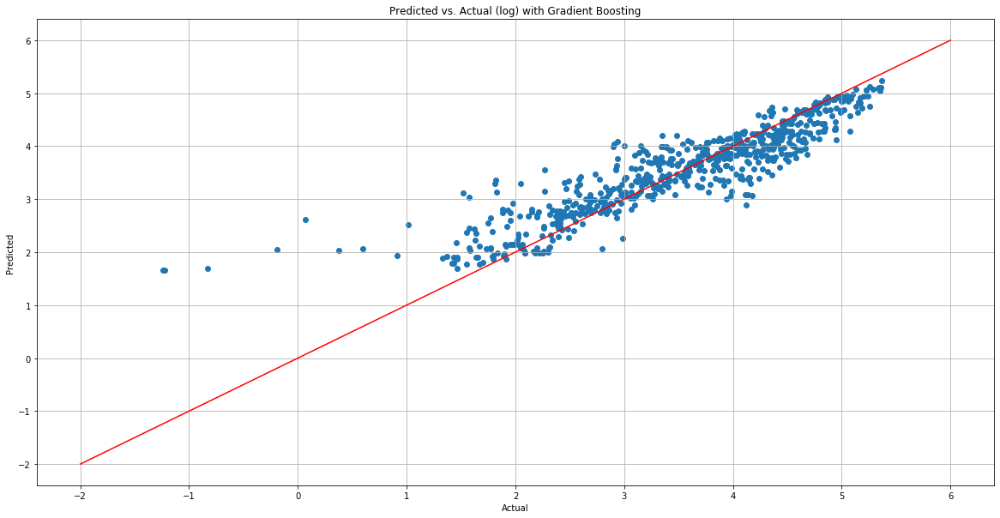

In [93]:
# Predict model on test data
y_pred = gbr.predict(x_test)
# Plot
plt.figure(figsize=(20,10))
plt.scatter(y_test, y_pred)
plt.plot([-2,6],[-2,6],color='red')
plt.grid(True)
plt.title('Predicted vs. Actual (log) with Gradient Boosting')
plt.ylabel('Predicted')
plt.xlabel('Actual');

# Metrics for Gradient Boosting Regression

In [100]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred).round(3))  
print('Mean Absolute Percent Error', mape(y_test, y_pred).round(3))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred).round(3))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)).round(3))
print('Accuracy Score:' , gbr.score(x_test,y_test).round(3))
print('R2 score:', r2_score(y_test, y_pred).round(3))
print('Cross Value Scores:', cross_val_score(gbr, x, y, cv=kf).round(3))

Mean Absolute Error: 0.328
Mean Absolute Percent Error 0.138
Mean Squared Error: 0.23
Root Mean Squared Error: 0.48
Accuracy Score: 0.805
R2 score: 0.805
Cross Value Scores: [0.822 0.817 0.818 0.812 0.841]


# Feature Importance

In [95]:
feature_importances = pd.DataFrame(gbr.feature_importances_,
                                   index = x_train.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)
print(feature_importances)

                                                    importance
Prevalence of anemia among women of reproductiv...    0.228693
Incidence of tuberculosis (per 100,000 people)        0.219720
Death rate, crude (per 1,000 people)                  0.168461
Urban population (% of total population)              0.140903
Prevalence of overweight (% of adults)                0.100832
Labor force, female (% of total labor force)          0.060583
Population, total                                     0.052312
Unemployment, total (% of total labor force)          0.028496


# Model Comparison

| Model                        | R2   | Mean Absolute Error | Mean Absolute Percent Error | Mean Squared Error | Root Mean Squared Error | Accuracy Score |
|------------------------------|------|---------------------|-----------------------------|--------------------|-------------------------|----------------|
| Lasso Regression             | .408 | .626                | .247                        | .699               | .836                    | .408           |
| Random Forest Regression     | .967 | .091                | .080                        | .039               | .198                    | .967           |
| Gradient Boosting Regression | .805 | .328                | .138                        | .230               | .480                    | .805           |

Text(0.5, 1.0, 'Boxplot of CV scores')

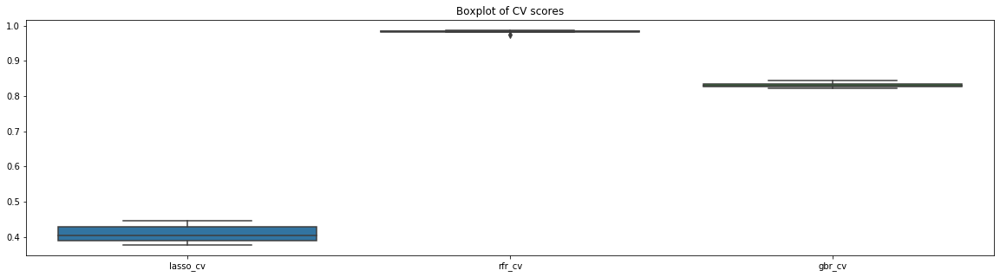

In [101]:
cv_scores = {'lasso_cv': cross_val_score(lasso_model, x, y, cv=kf),
             'rfr_cv': cross_val_score(rfr, x, y, cv=kf),
             'gbr_cv' : cross_val_score(gbr, x, y, cv=kf)}
cv_scores = pd.DataFrame(cv_scores)

plt.figure(figsize=(20,5))
ax = sns.boxplot(data=cv_scores)
plt.title('Boxplot of CV scores')

# Time Series Arima Model

# Dataset for Vietnam

In [110]:
vietnam = df[df['Country Name'] == 'Vietnam']
vietnam.drop(vietnam.tail(1).index,inplace=True)
vietnam

,Year,Country Name,"Adolescent fertility rate (births per 1,000 women ages 15-19)",Adults (ages 15+) and children (0-14 years) living with HIV,Adults (ages 15+) and children (ages 0-14) newly infected with HIV,Adults (ages 15+) living with HIV,Adults (ages 15+) newly infected with HIV,"Age at first marriage, female","Age at first marriage, male",Age dependency ratio (% of working-age population),"Age dependency ratio, old","Age dependency ratio, young","Age population, age 00, female, interpolated","Age population, age 00, male, interpolated","Age population, age 01, female, interpolated","Age population, age 01, male, interpolated","Age population, age 02, female, interpolated","Age population, age 02, male, interpolated","Age population, age 03, female, interpolated","Age population, age 03, male, interpolated","Age population, age 04, female, interpolated","Age population, age 04, male, interpolated","Age population, age 05, female, interpolated","Age population, age 05, male, interpolated","Age population, age 06, female, interpolated","Age population, age 06, male, interpolated","Age population, age 07, female, interpolated","Age population, age 07, male, interpolated","Age population, age 08, female, interpolated","Age population, age 08, male, interpolated","Age population, age 09, female, interpolated","Age population, age 09, male, interpolated","Age population, age 10, female, interpolated","Age population, age 10, male, interpolated","Age population, age 11, female, interpolated","Age population, age 11, male, interpolated","Age population, age 12, female, interpolated","Age population, age 12, male, interpolated","Age population, age 13, female, interpolated","Age population, age 13, male, interpolated","Age population, age 14, female, interpolated","Age population, age 14, male, interpolated","Age population, age 15, female, interpolated","Age population, age 15, male, interpolated","Age population, age 16, female, interpolated","Age population, age 16, male, interpolated","Age population, age 17, female, interpolated","Age population, age 17, male, interpolated","Age population, age 18, female, interpolated","Age population, age 18, male, interpolated","Age population, age 19, female, interpolated","Age population, age 19, male, interpolated","Age population, age 20, female, interpolated","Age population, age 20, male, interpolated","Age population, age 21, female, interpolated","Age population, age 21, male, interpolated","Age population, age 22, female, interpolated","Age population, age 22, male, interpolated","Age population, age 23, female, interpolated","Age population, age 23, male, interpolated","Age population, age 24, female, interpolated","Age population, age 24, male, interpolated","Age population, age 25, female, interpolated","Age population, age 25, male, interpolated",AIDS estimated deaths (UNAIDS estimates),Antiretroviral therapy coverage (% of people living with HIV),Antiretroviral therapy coverage for PMTCT (% of pregnant women living with HIV),ARI treatment (% of children under 5 taken to a health provider),"Birth rate, crude (per 1,000 people)",Births attended by skilled health staff (% of total),Capital health expenditure (% of GDP),"Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)","Cause of death, by injury (% of total)","Cause of death, by non-communicable diseases (% of total)",Children (0-14) living with HIV,Children (ages 0-14) newly infected with HIV,Children orphaned by HIV/AIDS,Children with fever receiving antimalarial drugs (% of children under age 5 with fever),"Community health workers (per 1,000 people)",Completeness of birth registration (%),"Completeness of birth registration, female (%)","Completeness of birth registration, male (%)","Completeness of birth registration, rural (%)","Completeness of birth registration, urban (%)",Completeness of death registration with cause-of-death information (%),"Comprehensive correct kn

In [111]:
#initiate train/test
timeseries_vn = vietnam['Life expectancy at birth, total (years)']
timeseries_vn = timeseries_vn.reset_index(drop=True)
train_vn = timeseries_vn[:49]
test_vn = timeseries_vn[49:]
timeseries_vn

0     59.039
1     59.720
2     60.387
3     61.020
4     61.581
5     61.963
6     62.037
7     61.767
8     61.186
9     60.383
10    59.563
11    58.980
12    58.826
13    59.203
14    60.112
15    61.446
16    63.010
17    64.547
18    65.859
19    66.865
20    67.542
21    67.942
22    68.203
23    68.439
24    68.688
25    68.972
26    69.293
27    69.624
28    69.943
29    70.252
30    70.551
31    70.842
32    71.124
33    71.399
34    71.666
35    71.923
36    72.168
37    72.399
38    72.617
39    72.824
40    73.025
41    73.228
42    73.438
43    73.654
44    73.875
45    74.092
46    74.295
47    74.474
48    74.625
49    74.745
50    74.837
51    74.904
52    74.958
53    75.006
54    75.056
55    75.110
56    75.172
57    75.241
58    75.317
Name: Life expectancy at birth, total (years), dtype: float64

# Test for Parameters

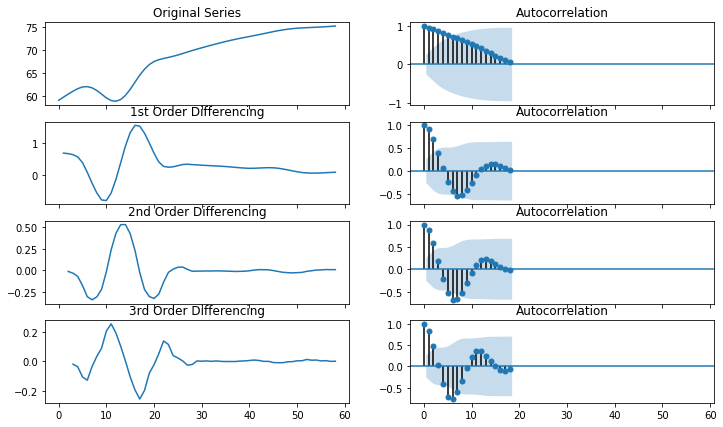

In [241]:
# Original Series
fig, axes = plt.subplots(4, 2, sharex=True)
axes[0, 0].plot(timeseries_vn); axes[0, 0].set_title('Original Series')
plot_acf(timeseries_vn, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(timeseries_vn.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(timeseries_vn.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(timeseries_vn.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(timeseries_vn.diff().diff().dropna(), ax=axes[2, 1])

#3rd
axes[3, 0].plot(timeseries_vn.diff().diff().diff()); axes[3, 0].set_title('3rd Order Differencing')
plot_acf(timeseries_vn.diff().diff().diff().dropna(), ax=axes[3, 1])


plt.show()

In [323]:
print("Augmented Dickey-Fuller p-value for original series for Vietnam:", adfuller(timeseries_vn.dropna())[1])
print("Augmented Dickey-Fuller p-value for 1st differential for Vietnam:", adfuller(timeseries_vn.diff().dropna())[1])
print("Augmented Dickey-Fuller p-value for 2nd differential for Vietnam:", adfuller(timeseries_vn.diff().diff().dropna())[1])

Augmented Dickey-Fuller p-value for original series for Vietnam: 2.4373933664278843e-07
Augmented Dickey-Fuller p-value for 1st differential for Vietnam: 0.7621689352700493
Augmented Dickey-Fuller p-value for 2nd differential for Vietnam: 0.009186457478246696


In [316]:
result = adfuller(timeseries_vn.diff().diff().dropna())
print('ADF Statistic: {}'.format(result[0]))
print('p-value: {}'.format(result[1]))
print('Critical Values:')
for key, value in result[4].items():
    print('\t{}: {}'.format(key, value))

ADF Statistic: -3.4561793232608107
p-value: 0.009186457478246696
Critical Values:
	1%: -3.5812576580093696
	5%: -2.9267849124681518
	10%: -2.6015409829867675


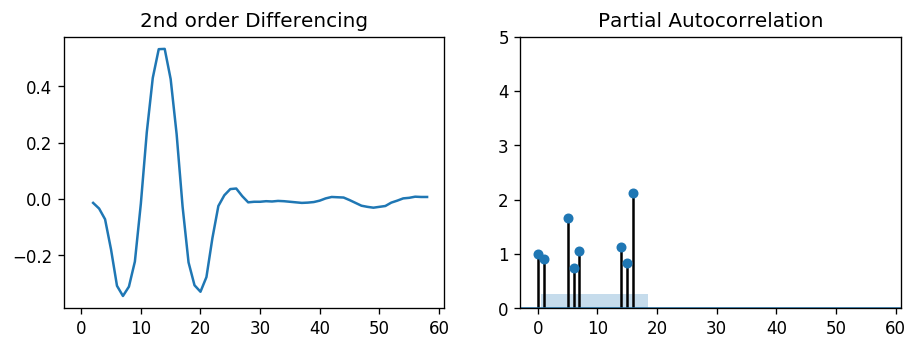

In [324]:
# PACF plot of 2nd order differenced series
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

fig, axes = plt.subplots(1, 2, sharex=True)
axes[0].plot(timeseries_vn.diff().diff()); axes[0].set_title('2nd order Differencing')
axes[1].set(ylim=(0,5))
plot_pacf(timeseries_vn.diff().diff().dropna(), ax=axes[1])

plt.show()

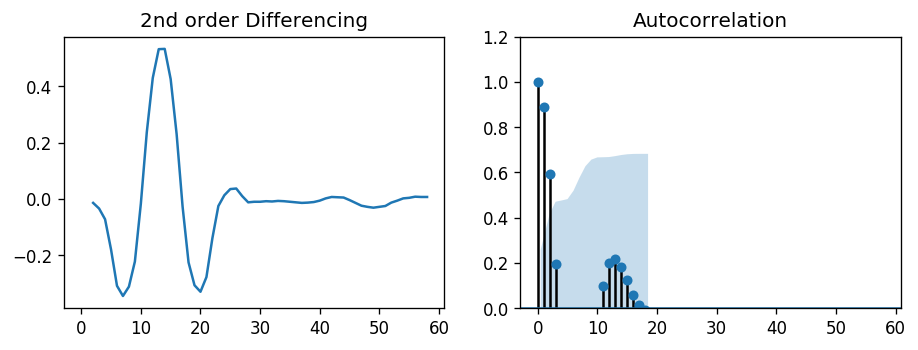

In [325]:
#ACF plot of 2nd order differenced series
fig, axes = plt.subplots(1, 2, sharex=True)
axes[0].plot(timeseries_vn.diff().diff()); axes[0].set_title('2nd order Differencing')
axes[1].set(ylim=(0,1.2))
plot_acf(timeseries_vn.diff().diff().dropna(), ax=axes[1])

plt.show()

# Arima Model on Train Set

In [420]:
#initiate ARIMA model
model = ARIMA(train_vn, order=(2, 2, 1))  
fitted = model.fit(disp=0)  
print(fitted.summary())

                                         ARIMA Model Results                                          
Dep. Variable:     D2.Life expectancy at birth, total (years)   No. Observations:                   47
Model:                                         ARIMA(2, 2, 1)   Log Likelihood                 109.715
Method:                                               css-mle   S.D. of innovations              0.021
Date:                                        Wed, 12 Aug 2020   AIC                           -209.429
Time:                                                20:10:15   BIC                           -200.179
Sample:                                                     2   HQIC                          -205.948
                                                                                                      
                                                       coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------

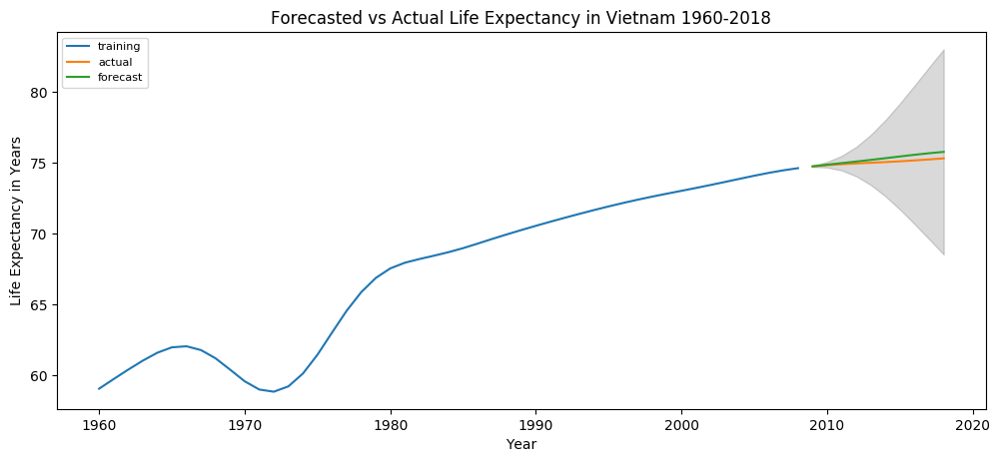

In [421]:
# Forecast
fc, se, conf = fitted.forecast(10, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test_vn.index)
lower_series = pd.Series(conf[:, 0], index=test_vn.index)
upper_series = pd.Series(conf[:, 1], index=test_vn.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(np.arange(1960, 2009),train_vn, label='training')
plt.plot(np.arange(2009, 2019),test_vn, label='actual')
plt.plot(np.arange(2009, 2019),fc_series, label='forecast')
plt.fill_between(np.arange(2009, 2019), lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecasted vs Actual Life Expectancy in Vietnam 1960-2018')
plt.legend(loc='upper left', fontsize=8)
plt.xlabel('Year')
plt.ylabel('Life Expectancy in Years')
plt.show()

In [394]:
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    acf1 = acf(fc-test_vn)[1]                      # ACF1
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 'acf1':acf1, 
            'corr':corr, 'minmax':minmax})

forecast_accuracy(fc, test_vn.values)


{'mape': 0.003155895361795759,
 'me': 0.23716148769257472,
 'mae': 0.23716148769257472,
 'mpe': 0.003155895361795759,
 'rmse': 0.2866266082181859,
 'acf1': 0.7560578865900581,
 'corr': 0.9958659244625528,
 'minmax': 0.0031414378876573057}

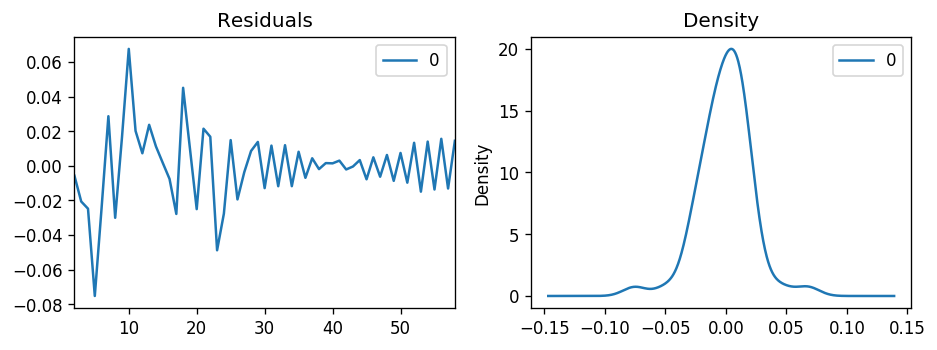

In [395]:
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

In [396]:
print('Mean Absolute Percent Error', np.mean(np.abs(fc - test_vn.values)/np.abs(fc)))

Mean Absolute Percent Error 0.003141437887657214


# Arima Model Forecasted 10 Years into the Future

In [402]:
model = ARIMA(timeseries_vn, order=(2,2,1))
model_fit = model.fit(disp=-1)
print(model_fit.summary())

                                         ARIMA Model Results                                          
Dep. Variable:     D2.Life expectancy at birth, total (years)   No. Observations:                   57
Model:                                         ARIMA(2, 2, 1)   Log Likelihood                 136.655
Method:                                               css-mle   S.D. of innovations              0.021
Date:                                        Wed, 12 Aug 2020   AIC                           -263.310
Time:                                                19:50:52   BIC                           -253.095
Sample:                                                     2   HQIC                          -259.340
                                                                                                      
                                                       coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------

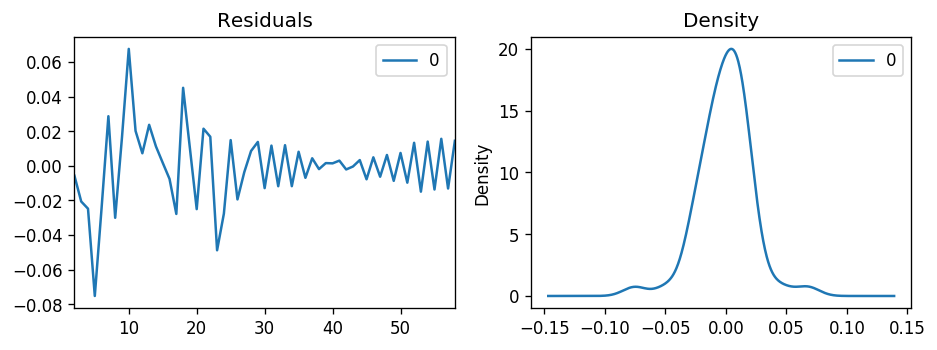

In [403]:
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

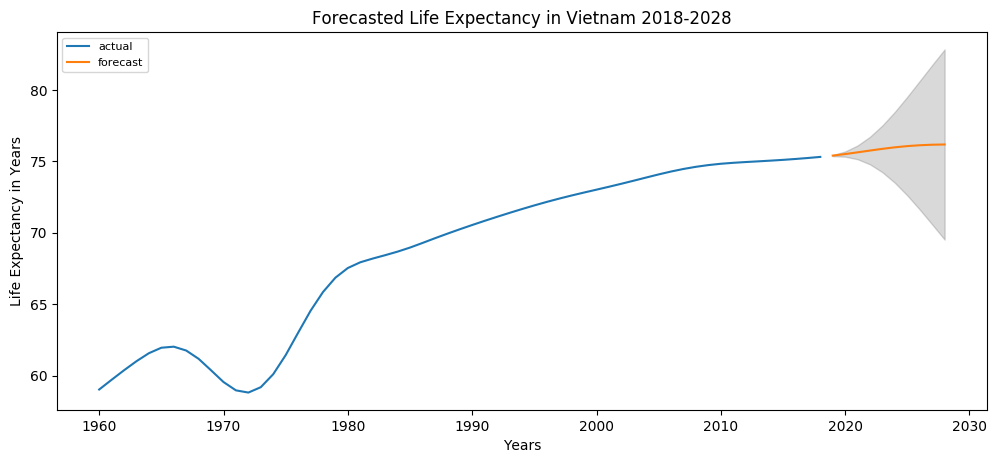

In [398]:
# Forecast
fc, se, conf = model_fit.forecast(10, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test_vn.index)
lower_series = pd.Series(conf[:, 0], index=test_vn.index)
upper_series = pd.Series(conf[:, 1], index=test_vn.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(np.arange(1960, 2019),timeseries_vn, label='actual')
plt.plot(np.arange(2019, 2029),fc_series, label='forecast')
plt.fill_between(np.arange(2019, 2029), lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecasted Life Expectancy in Vietnam 2018-2028')
plt.legend(loc='upper left', fontsize=8)
plt.xlabel('Years')
plt.ylabel('Life Expectancy in Years')
plt.show()